# <center><font color='MediumSeaGreen'> _Proyecto Data Science G45_</font>
## <center> _Modelo clasificador de delitos_ 

<center><img src="PredictLab.png" width=200 height=200 /></center>    

    
    
<center><b> Bárbara Pérez - Samuel Gallegos - Gustavo Dawson - Manuel Urrutia - Nicolás Tapia</b><center>

________________

## <font color='MediumSeaGreen'>Descripción del problema</font> 


La delincuencia, actualmente en nuestro país es un tema de gran relevancia.
Para nadie es sorpresa que la seguridad sea una necesidad prioritaria para las personas, junto con temas como la salud, el desempleo y la educación. 

No obstante a lo anterior, a pesar de múltiples iniciativas por parte de las autoridades, la delincuencia continúa en alza.
En los estudios de delincuencia y criminalidad, siempre se trabaja con un sesgo en la estimación de la cantidad de delitos, ya que estos ocupan como variable la tasa de denuncias y no la tasa real de delitos.

Esto se conoce bajo el concepto de CIFRA NEGRA, el cual explica la cantidad de denuncias no realizadas sobre crímenes reales.

Sobre ello es importante analizar cuáles son las posibles causas por las cuales la gente no denuncia:
* Desconfianza en las policías y aparato de justicia penal.
* No se quiere evidenciar la victimización.
* Burocracia en el proceso, tiempo en el trámite de denuncia.
* Se tiene miedo a la venganza o amenazas posteriores por parte del autor del delito (muy vigente en poblaciones).
* La víctima siente culpabilidad en lo ocurrido. (Ej: Estafas)
* Se desconoce la ocurrencia de un delito.

Lo que se busca con este proyecto es ayudar a disminuir esta cifra negra de denuncias, implementando un modelo de Machine learning que le permita a la población realizar una denuncia de una forma mucho más sencilla a la que existe actualmente en la plataforma www.denunciaseguro.cl.

___________

## <font color='MediumSeaGreen'> Requerimientos </font>


Para poder correr el notebook es necesario instalar las siguientes librerias:

- **pandas**igual a la versión 1.4.2
- **numpy** igual a la versión 1.23.0
- **missingno** igual a la versión 0.5.1
- **geopandas** igual a la versión 0.11.1
- **folium** igual a la versión 0.13.0
- **wordcloud** igual a la versión 1.8.2.2
- **matplotlib** igual a la versión 3.6.0
- **seaborn** igual a la versión 0.12.1
- **sklearn** igual a la versión 1.1.2
- **nltk** igual a la versión 3.7
- **xgboost** igual a la versión 1.7.1
- **pickle** igual a la versión 0.7.5
- **os**
- **openpyxl** igual a la versión 3.0.10
- **pip** igual a la versión 22.0.4
- **regex** igual a la versión 2022.9.13
- **mapclassify** igual a la versión 2.4.3
- **gradio** igual a la 3.14.0

_______

## <font color='MediumSeaGreen'>Sección 1: **Preliminares**</font> 

### 1.1 Descripción del problema

Lo que se busca con este proyecto es ayudar a disminuir esta cifra negra de denuncias, implementando un modelo de ML que le permita a la población realizar una denuncia de una forma mucho más sencilla a la que se realiza actualmente.

### 1.2 Descripción de la base de datos

Para desarrollar este desafío se debe utilizar la base de datos : **Base_Denuncia_Seguro_Diciembre_2021_PDI.xlsx** y **Base_Denuncia_Seguro_octubre_2022_PDI.xlsx**. En ella encontrarás las siguientes columnas:

* **ID**: Número interno de identificación de denuncia
* **GLOSA**: Texto correspondiente a la denuncia.
* **FECHA LLAMADA**: Fecha cuando se realizó la denuncia.
* **MES**: Mes cuando se realizó la denuncia
* **ANO**: Año cuando se realizó la denuncia.
* **ESTADO**: Estado en el que se encuentra actualmente la denuncia.
* **COD_GR_DEL**: Código del delito
* **GR_DEL**: Clasificación del delito bajo el número de ley correspondiente.
* **COD_SUB-DELITO**: Código del sub-delito
* **SUB-DELITO**: Nómbre del sub delito
* **COD _COM**: Código de comuna
* **COMUNA**: Nombre de comuna.
* **COD_PROV**: Código de provincia.
* **PROVINCIA**: Nombre de provincia.
* **COD_REG**: Código de region.
* **REGION**: Nombre de Region.
* **COD_DEST**: Código de destino.
* **DESTINO**: Destino a que se envia la denuncia para su posterior proceso.
* **COD_JURIS**: Código de juridicción de la denuncia.
* **JURISDICCIÓN**: Fiscalia a la que pertenece a la denuncia.
* **LATITUD**: Latitud donde se generó la denuncia.
* **LONGITUD**: Longitud donde se generó la denuncia.
* **COORDENADAS**: Coordenada en donde se generó la denuncia.
* **N° DENUNCIA**: Número de denuncia interno.
* **CONTADOR DE DENUNCIAS**: Contador de denuncias realizadas por el usuario.
* **CATEGORIZACIÓN SIMPLIFICADA**: Clasificación general de la renuncia realizada.


**Vector objetivo:**
- '*CATEGORIZACIÓN_SIMPLIFICADA*'


### 1.3 Pregunta e Hipótesis de trabajo

**Pregunta**: ¿Cuál es el motivo del alto abandono al momento de efectuar una denuncia en Denuncia Seguro vía Web?

**Hipótesis nula**: El alto abandono de ingreso de denuncias no se debe a la dificultad de ingreso de información.

**Hipótesis alternativa**: El alto abandono está relacionado con la gran cantidad de formularios y secciones, las cuales buscan a su vez generar una clasificación de los datos por parte del usuario. Simplificar dicho proceso, incorporando un modelo de machine learning, que permita eliminar formularios y secciones, a fin de que el usuario realice su denuncia con mayor rapidez y comodidad.


### 1.4 Objetivos generales


1. Generar un análisis exploratorio sobre los datos contenidos en el DataFrame, considerando palabras más comunes y distribución de las clases en el vector objetivo.

2. Pre-procesamiento de Texto:
 - Para trabajar adecuadamente con texto, debemos preprocesar y posteriormente representar cada oración como un conjunto de características.
 - En la data entregada por denunciaseguro existen datos sensibles, los que eliminaremos para proteger a la victima y victimario. Es por ello que se eliminarán nombres, apellidos, direcciones y regiones.
 - Un problema recurrente en el análisis de texto es la alta ocurrencia de preposiciones. Estas palabras serán eliminadas mediante la declaración de stopwords. Para generar la exclusión de stopwords, utilizaremos la librería nltk (Natural Language ToolKit) y adicionalmente agregamos un listado con palabras de uso común, las cuales serán eliminadas con una función propia.
 - Refinaremos los atributos a capturar mediante el proceso de lemantización (la reducción de variadas palabras con un tronco léxico común; ejemplo: Organización, Organiza, y Organizado presentan organi_ como tronco léxico en común) .

- Posterior a la refinación y preprocesamiento de las palabras, representaremos cada oración en una matriz (o corpus) que permitirá reflejar la cantidad de ocurrencias de 𝑊 palabra en un registro. Para ello, pueden hacer uso de las librerías 𝑖 de preprocesamiento sklearn.feature_extraction.text.CountVectorizer. De esta manera, tendremos un conjunto de características es mediante la frecuencia de ocurrencia de una palabra o término en el texto.

3. Preparación del vector objetivo y las matrices de entrenamiento y validación:

- Trabajaremos con siete clasificaciones: Armas, Contra la propiedad, Contra las personas, Drogas, Sexuales, VIF y Otros.

4. Entrenamiento de modelos:

- Implementaremos 4 modelos. Para cada uno de ellos lo realizaremos con hiper parámetros. 

- Se reportará el desempeño de cada modelo en las muestras de entrenamiento y validación. 

5. Seleccionaremos el mejor modelo.








### 1.5 Objetivos especificos

Implementación de un modelo de ML que le permita a la gente hacer una denuncia de una forma mucho más sencilla, permitiendo **clasificar** las denuncias según su tipo.

### 1.6 Implementación de la solución 

Para la resolución del problema, se utilizará el siguiente programa de trabajo:

<font color='MediumSeaGreen'>●</font> Implementación de librerias con funciones no nativas de python.

<font color='MediumSeaGreen'>●</font> Lecturas y análisis de la base de datos.

<font color='MediumSeaGreen'>●</font> Pre-procesamiento de datos, mediante:
 
    - Determinación, reconversión y eliminación de datos perdidos.
    - Recodificación las variables.
 
<font color='MediumSeaGreen'>●</font> Visualización gráfica de las variables, mediante:

    - La inspección del vector objetivo.
    - La inspección de las variables independientes.
    - La inspección de los datos perdidos de las variables recodificadas.
    - De ser necesario, reprocesar los datos en los resultados obtenidos.


 <font color='MediumSeaGreen'>●</font> Separación de muestras para modelamiento

 <font color='MediumSeaGreen'>●</font> Tipos de modelos a implementar
 
 <font color='MediumSeaGreen'>●</font> Construcción de varios modelos
 
<font color='MediumSeaGreen'>●</font> Evaluar metricas de los modelos mediante:

    - metricas de evaluación y comparación de los resultados.
    - validaciones cruzadas, optimización de los modelos y elección del mejor.


<font color='MediumSeaGreen'>●</font> Fundamentar el mejor modelo a utilizar

*Todo lo descrito se abordará más a fondo durante su ejecución.*

### 1.7 Criterios de optimización y metricas de desempeño de los modelos

**<u>Problema  de "Clasificación"</u>**
 - Criterios de optimización: aumentar la tasa de clases correctamente predichas
 - Reducir falsos positivos y falsos negativos.
 - Metricas de desempeño: Accuracy, recall, precision y f1-score.

### 1.8 Módelos de ML a implementar

- Regresión logística
- Multinomial Naive Bayes
- Support Vector Machine
- XGBoost


### 1.9 Archivos

Se entregará en un archivo .zip los siguientes archivos:

- Jupyter Notebook con el proyecto

- 2 archivos excel con la data

- Un archivo de funciones auxiliares con todas las funciones implementadas.

- Una carpeta denominada *'listado_palabras'*, la cual contiene 5 archivos con la información de palabras que se eliminarán en el preprocesamiento del texto.

- Una carpeta denominada *'comunas'*, la cual contiene un geojson con información de todas las comunas existententes en Chile.

- Un archivo *README.md* con los requerimientos necesarios para poder correr este notebook.



### 1.10 Otros.

<font color='Blue'>Todo comentario estará escrito de color ***Azul***

_____________

## <font color='MediumSeaGreen'>Sección 2 - Aspectos computacionales </font>

### 2.1 Librerías y módulos

Para la correcta realización del trabajo se hace necesario importar librerias no nativas de python, que permitan realizar el análisis de los datos, la transformación de estos, construir los modelos predictivos, entrenarlos y validarlos. 

A continuación se detallan e importan las librerías:

In [1]:
#Importar librerias a utilizar
import pandas as pd  #version 1.4.2
import numpy as np  #version 1.23.0
import missingno as msno #version 0.5.1

# scikit-learn version 1.1.2
from sklearn.model_selection import train_test_split #version 1.1.2

import geopandas as gpd #version 0.11.1
import folium as fl #version 0.13.0
#mapclassify #version 2.4.3 #no se utiliza directamente, requisito para metodo explore de geodataframe de geopandas
from wordcloud import WordCloud #version 1.8.2.2

# Librerias de gráficos
import matplotlib.pyplot as plt #version 3.6.0
import seaborn as sns #version 0.12.1

#librerías para preprocesamiento y extracción de texto
from sklearn.feature_extraction.text import CountVectorizer #version 1.1.2
import nltk #version 3.7
nltk.download('stopwords')
from nltk.corpus import stopwords #version  3.7

#librerías para validaciones cruzadas con distintos hiperparametros
from sklearn.model_selection import GridSearchCV #version 1.1.2

#importar librerías para modelar ML
from sklearn.linear_model import LogisticRegression  #version 1.1.2
from xgboost import XGBClassifier #version 1.6.2
from sklearn.naive_bayes import MultinomialNB #version 1.1.2
from sklearn.svm import SVC #version 1.1.2

#importar librerías para metricas de ML
from sklearn.metrics import mean_squared_error, r2_score #version 1.1.2
from sklearn.metrics import roc_curve, roc_auc_score #version 1.1.2
from sklearn.metrics import classification_report, accuracy_score #version 1.1.2
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score #version 1.1.2


# libreria para serialización
import pickle as pkl #version 0.7.5

# Clase para realizar una codificación de variable categórica
from sklearn.preprocessing import LabelEncoder #version 1.1.2

from time import time

# libreria para generar aplicacion web
import gradio as gr #version 3.14.0

import os
import base64

#ignorar avisos 
import warnings
warnings.filterwarnings("ignore")


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [2]:
## Otras librerias
#importamos librerias para cambiar los tamaños de visualización del Jupyter
from IPython.display import display, HTML
#mejoramos la visualización
display(HTML(data="""
<style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 85%; }
    div#maintoolbar-container { width: 99%; }
</style>
"""))
#agregamos javascript y link para mostrar/ocultar el código
HTML(
    '''
    <script>
    code_show=false; 
    function code_toggle() {
     if (code_show){
     $('div.input').hide();
     } else {
     $('div.input').show();
     }
     code_show = !code_show
    } 
    $( document ).ready(code_toggle);
    </script>
    <h4>
    Para ocultar/visualizar el código, presionar <a href="javascript:code_toggle()">AQUI</a>.</h4>
    '''
)

### 2.2 Funciones a utilizar creadas

Definimos las constantes que se utilizarán a lo largo del notebook.
De igual manera creamos una función denominada: '**Procesar_Todo'**, la cual tiene la opción de *True* y *False*.
**True**: Procesa todos los chunks del notebook
**False**: Solo procesa los chunks livianos para el proceso, es decir, no se procesarán las tablas, mapas y otras visualizaciones que pueden afectar en el tiempo del proceso.

In [3]:
# Definimos constantes que se utilizarán a lo largo del notebook
RANDOM_SEED = 123
PROCESAR_TODO = True # si es False procesa solo chunks livianos necesarios para el proceso

Se utilizaran funciones contenidas en las librerías importadas, con un comentario sobre su uso cuando corresponda. Se utilizarán también funciones creadas por nosotros.

Funciones creada por nosotros:
* **transformar_a_fecha** : Transforma una fecha a formato datetime.
* **contar_frecuencia**: Cuenta la frecuencia de los elementos de una lista.
* **extraer_mas_frecuentes**: Extrae los elementos más frecuentes de un diccionario.
* **leer_cvs_to_list**: Lee archivos de texto plano de una sola columna, los procesa para quitar tildes y espacios,los deja en minuscula y los retorna como lista.
* **text_preprocessor**: Proceso para normalizar los textos con las siguientes acciones:
    - transforma en minuscula y quita espacios al inicio y termino
    - quita codigos de denuncuas "w202%"
    - quita tildes de vocales
    - deja solo vocales y espacios
    - quita espacios multiples
    - quita palabras encontradas en el stopwords.
* **predict_category**: Predice las categorias de un listado de textos.

* **compara_columns_df**: Compara las columnas entre dos Data Frames.
* **contador_filas_columns**: Permite contar el numero de filas y de columnas de dos Data Frames.
* **generar_graficos_comparacion**: Función especifica para generar los graficos de comparación de modelos.
* **Modelo**: Clase que permite ser utilizada por la libreria gradio
* **generar_countplot**: Funcion para contruir gráficos de barras con la cantidad de elementos por categoría

In [4]:
#Importamos funciones propias
import funciones_auxiliares as faux

## <font color='MediumSeaGreen'>Sección 3: **Preprocesamiento y Limpieza Inicial**

### 3.1 Importación de Base de Datos 1 y 2

In [5]:
#Importar base de datos 1
denuncias_2021 = pd.read_excel('Base_Denuncia_Seguro_Diciembre_2021_PDI.xlsx', engine= 'openpyxl')
df_denuncias_2021 = pd.DataFrame(denuncias_2021)

In [6]:
#Importar base de datos 2
denuncias_2022 = pd.read_excel('Base_Denuncia_Seguro_octubre_2022_PDI.xlsx', engine= 'openpyxl')
df_denuncias_2022 = pd.DataFrame(denuncias_2022)

### 3.2 Visualización de base de datos 1

In [7]:
#Revisamos los datos importados en df_denuncias_2021
df_denuncias_2021.head()

,ID,GLOSA,FECHA LLAMADA,MES,ANO,ESTADO,COD_GR_DEL,GR_DEL,COD_SUB-DELITO,SUB-DELITO,...,COD_DEST,DESTINO,COD_JURIS,JURISDICCIÓN,LATITUD,LONGITUD,COORDENADAS,N° DENUNCIA,CONTADOR DE DENUNCIAS,CATEGORIZACIÓN SIMPLIFICADA
0,701275,W20210101005050001 - PRESUNTO DELITO DE MICROT...,01-01-2021,Enero,2021,Aprobado,15,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,7037.0,MICROTRAFICO (TRAFICO DE PEQUEÑAS CANTIDADES A...,...,400,Fiscalía Regiones Sector Sur,410,Fiscalía Regional de OHiggins,-34.1692309,-70.7568795,"-34.1692309, -70.7568795",52361,1,Drogas
1,701276,PRESUNTO MICROTRÁFICO DE CLORHIDRATO DE COCAÍN...,01-01-2021,Enero,2021,Aprobado,15,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,7037.0,MICROTRAFICO (TRAFICO DE PEQUEÑAS CANTIDADES A...,...,60,Fiscalía Metropolitana Occidente,60,Fiscalía Metropolitana Occidente,-33.614641,-70.9048698,"-33.614641,-70.9048698",52342,1,Drogas
2,701277,W20210101011717002. PRESUNTO TRÁFICO DE DROGAS...,01-01-2021,Enero,2021,Aprobado,15,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,7007.0,TRAFICO ILICITO DE DROGAS ART. 3 LEY Nº 20.000.,...,400,Fiscalía Regiones Sector Sur,410,Fiscalía Regional de OHiggins,-34.1691105,-70.7570963,"-34.1691105, -70.7570963",52369,1,Drogas
3,701278,W20210101013131003. PRESUNTA TENENCIA ILEGAL D...,01-01-2021,Enero,2021,Aprobado,18,LEY 17.798 CONTROL DE ARMAS,10001.0,"TENENCIA ILEGAL DE ARMA DE FUEGO, MUNICIONES Y...",...,200,Fiscalía Regiones Sector Norte,240,Fiscalía Regional de Atacama,-28.5660174,-70.7690558,"-28.5660174, -70.7690558",52327,1,Armas
4,701279,"PRESUNTO MICROTRÁFICO DE MARIHUANA PROCESADA, ...",01-01-2021,Enero,2021,Aprobado,15,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,7037.0,MICROTRAFICO (TRAFICO DE PEQUEÑAS CANTIDADES A...,...,60,Fiscalía Metropolitana Occidente,60,Fiscalía Metropolitana Occidente,-33.7327331,-70.9058721,"-33.7327331,-70.9058721",52343,1,Drogas


<font color='Blue'>Se observa que algunas glosas cuentan  con *'W202(..)'*, dicha expresión corresponde a el número interno de denuncia realizada por la página web denuncia seguro. Decidimos agregar dicha expresión a la función que eliminará palabras poco utiles para su posterior clasificación.

In [8]:
#Se contabiliza la frecuencia del vector objetivo
df_denuncias_2021['CATEGORIZACIÓN SIMPLIFICADA'].value_counts()

Drogas                 12866
VIF                      911
Otros                    762
Contra la propiedad      582
Armas                    371
Sexuales                 162
Contra las personas       86
Name: CATEGORIZACIÓN SIMPLIFICADA, dtype: int64

<font color='Blue'>Se observa que hay un desbalance de clases con el grupo *'Drogas'* respecto a las demás sub-clasificaciones. 

### 3.3 Visualización de Base de datos 2

In [9]:
#Revisamos los datos importados en df_denuncias_2022
df_denuncias_2022.head()

,ID,GLOSA,FECHA LLAMADA,MES,ANO,ESTADO,GR_DEL,COD_GR_DEL,SUB-DELITO,COD_SUB-DELITO,...,DESTINO,COD_DEST,JURISDICCIÓN,COD_JURIS,LATITUD,LONGITUD,COORDENADAS,N° DENUNCIA,CONTADOR DE DENUNCIAS,CATEGORIZACIÓN SIMPLIFICADA
0,723280,W20220101004646001. PRESUNTO MICROTRÁFICO DE C...,01-01-2022,Enero,2022,Denuncia jurídica,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,15,MICROTRAFICO (TRAFICO DE PEQUEÑAS CANTIDADES A...,7037.0,...,Fiscalía RM Centro Norte,50.0,Fiscalía Centro Norte,50,-33.3288872,-70.7631852,"-33.3288872,-70.7631852",65833,1,Drogas
1,723282,W20220101025757003 PRESUNTO MICROTRÁFICO MARIH...,01-01-2022,Enero,2022,Denuncia jurídica,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,15,MICROTRAFICO (TRAFICO DE PEQUEÑAS CANTIDADES A...,7037.0,...,Fiscalía RM Oriente,70.0,Fiscalía Oriente,70,-33.5589533,-70.6046911,"-33.5589533,-70.6046911",65831,1,Drogas
2,723283,W20220101032424004 PRESUNTO MICROTRÁFICO DE MA...,01-01-2022,Enero,2022,Denuncia jurídica,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,15,MICROTRAFICO (TRAFICO DE PEQUEÑAS CANTIDADES A...,7037.0,...,Fiscalías Norte de Chile,200.0,Fiscalía Local de Valparaíso,260,-33.0491286,-71.6020328,"-33.0491286,-71.6020328",65800,1,Drogas
3,723284,"PRESUNTO MICROTRÁFICO DE MARIHUANA PROCESADA, ...",01-01-2022,Enero,2022,Denuncia jurídica,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,15,MICROTRAFICO (TRAFICO DE PEQUEÑAS CANTIDADES A...,7037.0,...,Fiscalías Sur de Chile,400.0,Fiscalía Local de Los Angeles,430,-37.4720546,-72.3728711,"-37.4720546,-72.3728711",65739,1,Drogas
4,723285,W20220101040606005 PRESUNTO MICROTRÁFICO DE DR...,01-01-2022,Enero,2022,Denuncia jurídica,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,15,MICROTRAFICO (TRAFICO DE PEQUEÑAS CANTIDADES A...,7037.0,...,Fiscalía RM Centro Norte,50.0,Fiscalía Centro Norte,50,-33.4318183,-70.7340399,"-33.4318183,-70.7340399",65834,1,Drogas


<font color='Blue'>Al igual que la data anterior se observa la expresión *'W202(...)'*. Dado que está presente en ambas datas, se procederá a eliminar en el punto *'4.3 Eliminación de datos sensibles'*.

In [10]:
#Se contabiliza la frecuencia del vector objetivo
df_denuncias_2022['CATEGORIZACIÓN SIMPLIFICADA'].value_counts()

Drogas                 12193
Otros                    921
Contra la propiedad      671
VIF                      670
Armas                    492
Sexuales                 149
Contra las personas       59
sexuales                   9
No definido                1
Name: CATEGORIZACIÓN SIMPLIFICADA, dtype: int64

<font color='Blue'>Al igual en el DataFrame anterior, se observa que hay un desbalance de clases con el grupo *'Drogas'* respecto a las demás sub-clasificaciones.

<font color='Blue'>Se visualiza que dentro de la columna 'CATEGORIZACIÓN SIMPLIFICADA' existen dos diferentes sub-categorias de delitos sexuales, ambos hacen referencia al mismo delito, solo se diferencian en la manera de como se escribieron. Es por ello que agruparemos ambas sub-categorias en solo una.

<font color='Blue'>De igual manera se observa que dentro de la columna 'CATEGORIZACIÓN SIMPLIFICADA' existe la sub-categoria 'No definido' la cual la agruparemos dentro de la sub categorización 'Otros'.

In [11]:
#Igualamos los nombres de las columnas correspondiente a 'Sexuales' en ambos Data Frames
df_denuncias_2022['CATEGORIZACIÓN SIMPLIFICADA'] = df_denuncias_2022['CATEGORIZACIÓN SIMPLIFICADA'].str.replace('sexuales', 'Sexuales') 
df_denuncias_2022['CATEGORIZACIÓN SIMPLIFICADA'] = df_denuncias_2022['CATEGORIZACIÓN SIMPLIFICADA'].str.replace('No definido', 'Otros')

In [12]:
#Revisamos los cambios realizados
df_denuncias_2022['CATEGORIZACIÓN SIMPLIFICADA'].value_counts()

Drogas                 12193
Otros                    922
Contra la propiedad      671
VIF                      670
Armas                    492
Sexuales                 158
Contra las personas       59
Name: CATEGORIZACIÓN SIMPLIFICADA, dtype: int64

<font color='Blue'> Se observa que los cambios se realizaron correctamente.

### 3.4 Comparación de base de datos

In [13]:
#Comparamos las columnas de ambos DataFrame
faux.compara_columns_df (df_denuncias_2021,df_denuncias_2022)

Campos que difieren entre DataFrame 1 y DataFrame 2: 
 set()

Campos que difieren entre DataFrame 2 y DataFrame 1: 
 set()


<font color='Blue'>No se observan diferencias entre ambas base de datos.

In [14]:
#Contamos las filas y las columnas de ambos DataFrame
faux.contador_filas_columns(df_denuncias_2021,df_denuncias_2022)

La cantidad de registros en Data Frame 1:
 filas, columnas: (15740, 26)
La cantidad de registros en Data Frame 2:
 filas, columnas: (15165, 26)


<font color='Blue'>*Se observan las mismas cantidad de columnas entre ambos archivos (26 columnas), pero una diferencia 575 filas.*

<font color='Blue'>Constatamos que cuentan con la mismo nombre de columnas,pero con diferente información en sus filas. Es por ello que decidimos juntar ambos Data Frame, con el fin de tener una sola base de datos con mayor información y diversa, logrando así enriquecer nuestros datos, quedando finalmente un solo Data Frame con 26 columnas y un total de 30.905 filas.

### 3.5 Union de ambos Data Frame

In [15]:
# Uniremos ambos dataframe
df_denuncias = pd.concat([df_denuncias_2021,df_denuncias_2022], ignore_index=True)
df_denuncias.shape

(30905, 26)

In [16]:
#  Remover columnas de índice como Unnamed: 0 y/o index.
df_denuncias = df_denuncias.drop(columns='ID')
df_denuncias.head()

,GLOSA,FECHA LLAMADA,MES,ANO,ESTADO,COD_GR_DEL,GR_DEL,COD_SUB-DELITO,SUB-DELITO,COD _COM,...,COD_DEST,DESTINO,COD_JURIS,JURISDICCIÓN,LATITUD,LONGITUD,COORDENADAS,N° DENUNCIA,CONTADOR DE DENUNCIAS,CATEGORIZACIÓN SIMPLIFICADA
0,W20210101005050001 - PRESUNTO DELITO DE MICROT...,01-01-2021,Enero,2021,Aprobado,15,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,7037.0,MICROTRAFICO (TRAFICO DE PEQUEÑAS CANTIDADES A...,6101.0,...,400.0,Fiscalía Regiones Sector Sur,410,Fiscalía Regional de OHiggins,-34.1692309,-70.7568795,"-34.1692309, -70.7568795",52361,1,Drogas
1,PRESUNTO MICROTRÁFICO DE CLORHIDRATO DE COCAÍN...,01-01-2021,Enero,2021,Aprobado,15,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,7037.0,MICROTRAFICO (TRAFICO DE PEQUEÑAS CANTIDADES A...,13605.0,...,60.0,Fiscalía Metropolitana Occidente,60,Fiscalía Metropolitana Occidente,-33.614641,-70.9048698,"-33.614641,-70.9048698",52342,1,Drogas
2,W20210101011717002. PRESUNTO TRÁFICO DE DROGAS...,01-01-2021,Enero,2021,Aprobado,15,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,7007.0,TRAFICO ILICITO DE DROGAS ART. 3 LEY Nº 20.000.,6101.0,...,400.0,Fiscalía Regiones Sector Sur,410,Fiscalía Regional de OHiggins,-34.1691105,-70.7570963,"-34.1691105, -70.7570963",52369,1,Drogas
3,W20210101013131003. PRESUNTA TENENCIA ILEGAL D...,01-01-2021,Enero,2021,Aprobado,18,LEY 17.798 CONTROL DE ARMAS,10001.0,"TENENCIA ILEGAL DE ARMA DE FUEGO, MUNICIONES Y...",3304.0,...,200.0,Fiscalía Regiones Sector Norte,240,Fiscalía Regional de Atacama,-28.5660174,-70.7690558,"-28.5660174, -70.7690558",52327,1,Armas
4,"PRESUNTO MICROTRÁFICO DE MARIHUANA PROCESADA, ...",01-01-2021,Enero,2021,Aprobado,15,LEY 20.000 TRAFICO ILICITO DE ESTUPEFACIENTES ...,7037.0,MICROTRAFICO (TRAFICO DE PEQUEÑAS CANTIDADES A...,13603.0,...,60.0,Fiscalía Metropolitana Occidente,60,Fiscalía Metropolitana Occidente,-33.7327331,-70.9058721,"-33.7327331,-70.9058721",52343,1,Drogas


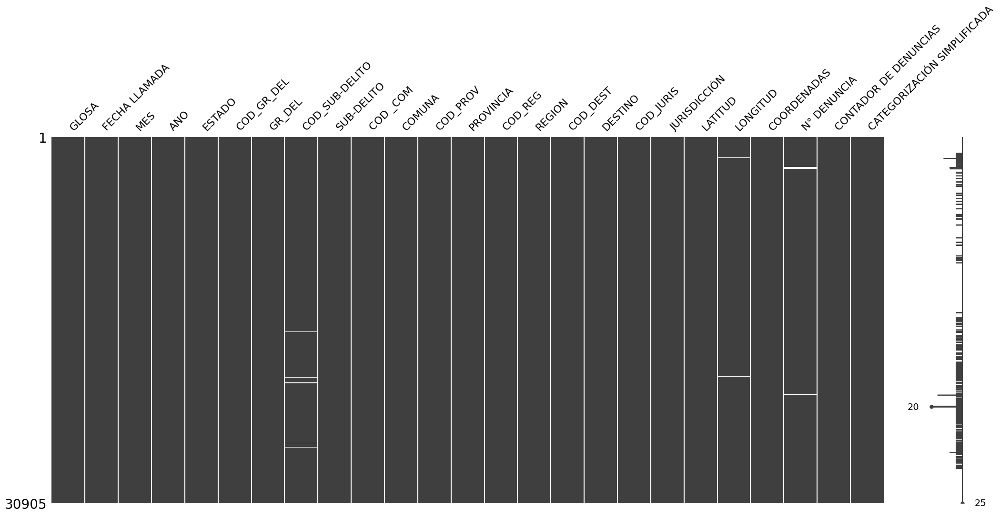

In [17]:
# Observamos la presencia de datos nulos
if PROCESAR_TODO:   
    msno.matrix(df_denuncias)

<font color='Blue'> Se observan que hay datos perdidos en nuestro nuevo Data Frame.

In [18]:
# Contamos los datos nulos
df_denuncias.isnull().sum()

GLOSA                            0
FECHA LLAMADA                    0
MES                              0
ANO                              0
ESTADO                           0
COD_GR_DEL                       0
GR_DEL                           0
COD_SUB-DELITO                 221
SUB-DELITO                       1
COD _COM                         4
COMUNA                           0
COD_PROV                        56
PROVINCIA                        0
COD_REG                          4
REGION                           0
COD_DEST                         3
DESTINO                          0
COD_JURIS                        4
JURISDICCIÓN                     0
LATITUD                          0
LONGITUD                       131
COORDENADAS                      0
N° DENUNCIA                    146
CONTADOR DE DENUNCIAS            0
CATEGORIZACIÓN SIMPLIFICADA      0
dtype: int64

<font color='Blue'> Se observan datos nulos en las siguientes columnas: 

* <font color='Blue'>**'COD_SUB-DELITO'**  = 221 datos nulos, esto significa un 0.7% del total de datos.

* <font color='Blue'>**'SUB-DELITO'**   = 1 datos nulos, esto significa un 0.0% del total de datos.

* <font color='Blue'>**'COD _COM'**  = 4 datos nulos, esto significa un 0.0% del total de datos.

* <font color='Blue'>**'COD_PROV'** = 56 datos nulos, esto significa un 0.01% del total de datos.

* <font color='Blue'>**'COD_REG'**  = 4 datos nulos, esto significa un 0.0% del total de datos.

* <font color='Blue'>**'COD_DEST'**  = 3 datos nulos, esto significa un 0.0% del total de datos.

* <font color='Blue'>**'COD_JURIS'** = 4 datos nulos, esto significa un 0.7% del total de datos.

* <font color='Blue'>**'LONGITUD'** = 131 datos nulos, esto significa un 0.0% del total de datos

* <font color='Blue'>**'N° DENUNCIA'**  = 146 datos nulos, esto significa un 0.04% del total de datos.


<font color='Blue'>Al ser porcentajes poco significativos decidimos eliminar dichos datos

In [19]:
#eliminamos los datos nulos
df_denuncias = df_denuncias.dropna()

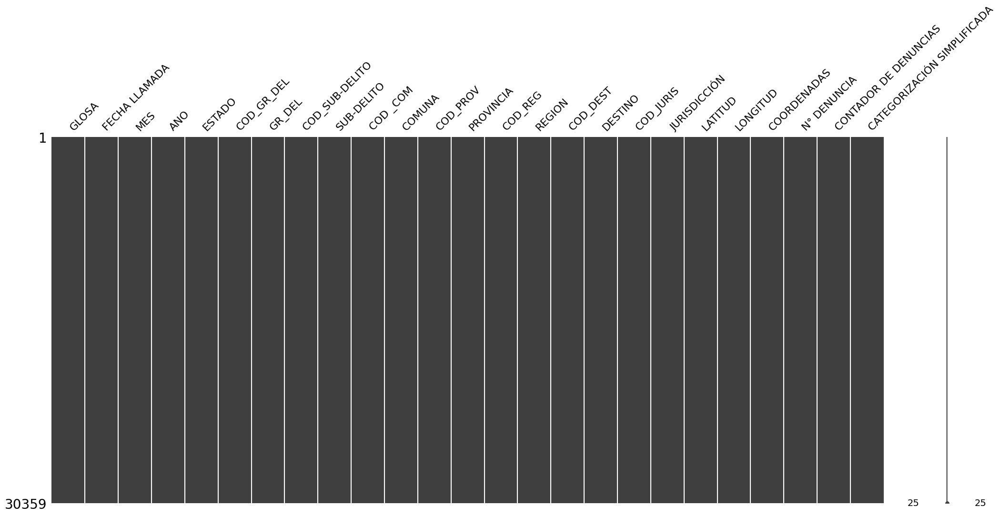

In [20]:
if PROCESAR_TODO:
    # Revisamos que ya no existan datos nulos
    msno.matrix(df_denuncias)

<font color='Blue'> Ya no se observan datos nulos

In [21]:
# Confirmamos la eliminación de los datos nulos
df_denuncias.isnull().sum()

GLOSA                          0
FECHA LLAMADA                  0
MES                            0
ANO                            0
ESTADO                         0
COD_GR_DEL                     0
GR_DEL                         0
COD_SUB-DELITO                 0
SUB-DELITO                     0
COD _COM                       0
COMUNA                         0
COD_PROV                       0
PROVINCIA                      0
COD_REG                        0
REGION                         0
COD_DEST                       0
DESTINO                        0
COD_JURIS                      0
JURISDICCIÓN                   0
LATITUD                        0
LONGITUD                       0
COORDENADAS                    0
N° DENUNCIA                    0
CONTADOR DE DENUNCIAS          0
CATEGORIZACIÓN SIMPLIFICADA    0
dtype: int64

<font color='Blue'>Ya no se observan datos nulos en nuestro Data Frame, sin embargo podemos observar que existen columnas con espacio en su nombre o guión medio; este es el caso de las siguientes columnas:

- <font color='Blue'>'FECHA LLAMADA'.
- <font color='Blue'>'COD_SUB-DELITO'.
- <font color='Blue'>'SUB-DELITO'.
- <font color='Blue'>'COD _COM'.
- <font color='Blue'>'N° DENUNCIA'.
- <font color='Blue'>'CONTADOR DE DENUNCIAS'.
- <font color='Blue'>'CATEGORIZACIÓN SIMPLIFICADA'.

<font color='Blue'>Para prevenir posibles futuros errores reemplazaremos los caracteres especiales y espacios por guión bajo.

In [22]:
#reemplazamos carecteres y espacios en los nombres de las variables
#para evitar problemas futuros en el modelamiento
df_denuncias = df_denuncias.rename(columns=lambda x: x.replace(" ","_"))
df_denuncias = df_denuncias.rename(columns=lambda x: x.replace("-","_"))
df_denuncias = df_denuncias.rename(columns=lambda x: x.replace("__","_"))

In [23]:
# Revisamos los cambios realizados mostrando las columnas de los datos, cantidad y su tipo de dato.
df_denuncias.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30359 entries, 0 to 30904
Data columns (total 25 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   GLOSA                        30359 non-null  object 
 1   FECHA_LLAMADA                30359 non-null  object 
 2   MES                          30359 non-null  object 
 3   ANO                          30359 non-null  int64  
 4   ESTADO                       30359 non-null  object 
 5   COD_GR_DEL                   30359 non-null  int64  
 6   GR_DEL                       30359 non-null  object 
 7   COD_SUB_DELITO               30359 non-null  float64
 8   SUB_DELITO                   30359 non-null  object 
 9   COD_COM                      30359 non-null  float64
 10  COMUNA                       30359 non-null  object 
 11  COD_PROV                     30359 non-null  float64
 12  PROVINCIA                    30359 non-null  object 
 13  COD_REG         

<font color='Blue'> Se realizaron los cambios correctamente.

In [24]:
#Eliminamos columnas que no utilizaremos en este proyecto
df_denuncias = df_denuncias.drop(['MES','ANO', 'COD_GR_DEL', 'GR_DEL', 'COD_SUB_DELITO', 'SUB_DELITO','COD_PROV', 'PROVINCIA', 'COD_REG','REGION' ,'COD_DEST', 'DESTINO', 'COD_JURIS', 'JURISDICCIÓN','LATITUD','LONGITUD', 'COORDENADAS','N°_DENUNCIA', 'CONTADOR_DE_DENUNCIAS'], axis=1)

In [25]:
#revisamos el nuevo df ordenado
df_denuncias.sort_index(ascending=True)

,GLOSA,FECHA_LLAMADA,ESTADO,COD_COM,COMUNA,CATEGORIZACIÓN_SIMPLIFICADA
0,W20210101005050001 - PRESUNTO DELITO DE MICROT...,01-01-2021,Aprobado,6101.0,Rancagua,Drogas
1,PRESUNTO MICROTRÁFICO DE CLORHIDRATO DE COCAÍN...,01-01-2021,Aprobado,13605.0,Peñaflor,Drogas
2,W20210101011717002. PRESUNTO TRÁFICO DE DROGAS...,01-01-2021,Aprobado,6101.0,Rancagua,Drogas
3,W20210101013131003. PRESUNTA TENENCIA ILEGAL D...,01-01-2021,Aprobado,3304.0,Huasco,Armas
4,"PRESUNTO MICROTRÁFICO DE MARIHUANA PROCESADA, ...",01-01-2021,Aprobado,13603.0,Isla de Maipo,Drogas
...,...,...,...,...,...,...
30900,PRESUNTO DELITO DE TENENCIA ILEGAL DE ARMA DE ...,31-10-2022,Denuncia jurídica,13124.0,Pudahuel,Armas
30901,"PRESUNTO MICROTRÁFICO DE DROGAS, EFECTUADO POR...",31-10-2022,Denuncia jurídica,8110.0,Talcahuano,Drogas
30902,"PRESUNTO MICROTRÁFICO DE DROGAS, EFECTUADO POR...",31-10-2022,Denuncia jurídica,10101.0,Puerto Montt,Drogas
30903,PRESUNTO MICROTRÁFICO DE MARIHUANA PROCESADA Y...,31-10-2022,Denuncia jurídica,13119.0,Maipú,Drogas


### 3.6 Extracción de data de validación

Del total de la data decidimos extraer un 10% para guardarlo como data de validación.

In [26]:
#División de data, guardando el 10% en otro archivo para validación
df_denuncias, df_validacion = train_test_split(df_denuncias, test_size = 0.1, random_state = RANDOM_SEED)

In [27]:
# Exportacion de datos de validación a CSV
df_validacion.to_csv('df_validacion.csv', index=False, sep=';', encoding='utf-8')

______

## <font color='MediumSeaGreen'>Sección 4 - Descripción </font>

##### En el presente capitulo se trabajarán los siguientes puntos:
- Análisis univariado de atributos y vector(es) objetivo(s).
- Análisis bivariado entre atributos y con respecto a vector(es) objetivo(s).
- Frecuencia de palabras

### 4.1 Análisis univariado

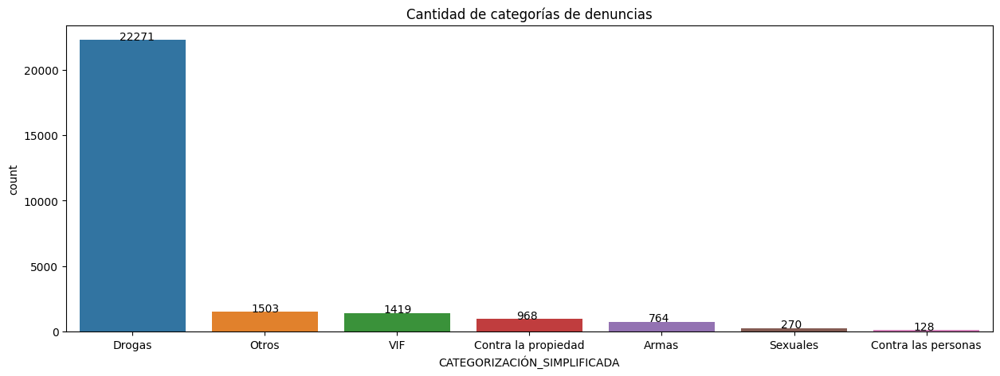

In [28]:
# Graficamos la cantidad de datos en cada categoría del vector objetivo, ordenados por cantidad.
faux.generar_countplot(df_denuncias, 'CATEGORIZACIÓN_SIMPLIFICADA', label_encoder=None, procesar=PROCESAR_TODO)


<font color='Blue'>Se puede observar que existe un claro desbalance de la categoría drogas en comparación con las otras categorías (casi 15 veces mayor que la segunda categoría con más datos). En el capítulo 5 Feature Engineering se evaluarán, si fuese necesario, los mecanismos para evitar problemas de desbalance en el modelo.

In [29]:
# leemos geojson de comunas para crear un mapa comunal de denuncias
if PROCESAR_TODO:
    comunas = gpd.read_file('comunas/comunas.geojson')
    comunas.crs = 'EPSG:4326'
    display(comunas.head())

,COMUNA,NOM_COMUNA,T_POB,T_VIV,geometry
0,12102,LAGUNA BLANCA,274.0,285.0,"MULTIPOLYGON (((-70.87540 -52.05200, -70.87140..."
1,2202,OLLAGÜE,321.0,439.0,"MULTIPOLYGON (((-68.41250 -20.93460, -68.29500..."
2,12303,TIMAUKEL,405.0,214.0,"MULTIPOLYGON (((-69.59060 -53.63300, -69.58710..."
3,11303,TORTEL,523.0,320.0,"MULTIPOLYGON (((-74.00950 -46.97020, -74.01270..."
4,12103,RÍO VERDE,617.0,231.0,"MULTIPOLYGON (((-71.47370 -52.65080, -71.46970..."


In [30]:
# prcesamos los datos de denuncias para poder anexarlo al geodatafre de camunas
if PROCESAR_TODO:
    # copiamos el dataframe de denuncias para eliminar los registros con datos nulos en COD_COM y con las columnas que no nos interesan
    df_denuncias_comunas = df_denuncias[
        ["CATEGORIZACIÓN_SIMPLIFICADA", "COD_COM"]
    ].copy()
    df_denuncias_comunas = df_denuncias_comunas.dropna(subset=["COD_COM"])
    # cambiamos el tipo de dato de COD_COM a string
    df_denuncias_comunas["COD_COM"] = (
        df_denuncias_comunas["COD_COM"].astype(int).astype(str)
    )
    display(df_denuncias_comunas.head())


,CATEGORIZACIÓN_SIMPLIFICADA,COD_COM
24436,Drogas,13201
25894,Armas,13101
16096,Drogas,13125
27942,Drogas,2201
2301,Drogas,16301


In [31]:
# contamos la cantidad de denuncias por comuna
if PROCESAR_TODO:
    # agregamos una columna al geodataframe de comunas con la cantidad de denuncias por comuna.
    comunas['DENUNCIAS'] = comunas['COMUNA'].map(df_denuncias_comunas['COD_COM'].value_counts())
    # si no hay denuncias en una comuna, se agrega un 0
    comunas['DENUNCIAS'] = comunas['DENUNCIAS'].fillna(0)
    # generamos un campo con la cantidad de denuncias por cada 1000 habitantes
    comunas['DENUNCIAS_10000_HABITANTES'] = (comunas['DENUNCIAS'] / comunas['T_POB'] * 10000).round(1)
    # quitamos las comunas que no tienen denuncias para que no se vean en el mapa y aligerar el proceso
    comunas = comunas[comunas['DENUNCIAS'] > 0]
    display(comunas.head())

,COMUNA,NOM_COMUNA,T_POB,T_VIV,geometry,DENUNCIAS,DENUNCIAS_10000_HABITANTES
11,12402,TORRES DEL PAINE,1209.0,226.0,"MULTIPOLYGON (((-72.45860 -50.61780, -72.45110...",7.0,57.9
14,10404,PALENA,1711.0,1002.0,"MULTIPOLYGON (((-72.16780 -43.26090, -72.16550...",2.0,11.7
17,12201,CABO DE HORNOS,2063.0,762.0,"MULTIPOLYGON (((-71.35910 -54.37610, -71.35490...",1.0,4.8
19,11402,RÍO IBÁÑEZ,2666.0,1813.0,"MULTIPOLYGON (((-72.49280 -45.97480, -72.48630...",1.0,3.8
20,1404,HUARA,2730.0,2871.0,"MULTIPOLYGON (((-69.61800 -19.02440, -69.61000...",1.0,3.7


In [32]:
# generamos un mapa interactivo con las comunas y su cantidad de denuncias cada 10.000 habitantes
if PROCESAR_TODO:
    display(comunas.explore(
        column='DENUNCIAS_10000_HABITANTES',
        cmap='OrRd',
        legend=True,
        tooltip=['NOM_COMUNA','DENUNCIAS','T_POB','DENUNCIAS_10000_HABITANTES'],
        m=fl.Map(location=[-33.4372, -70.6506], zoom_start=10),
        scheme='EqualInterval',
        k=5,
        style_kwds={'weight': 0.5, 'color': 'grey', 'fillOpacity': 0.8},
        tooltip_kwds={'aliases': ['Comuna','Denuncias','Población','Denuncias por 10.000 habitantes']},
        legend_kwds={'caption': 'Denuncias por 10.000 habitantes'}
    ))

<font color='Blue'>Se puede ver que exiten comunas que destacan por su relación cantidad de denuncias / población.  
En la RM encomtramos Independencia y San Joaquin como unas de las con mayor indice de denuncias por 10.000 habitantes.
Por otro lado, se detacan Lo Barnechea y Vitacura como comunas de RM con muy baja cantidad de denuncias por 10.000 habitantes.
Tambien llama la atención de Torres del Paine, en el extremo sur de Chile.

### 4.2 Análisis bivariado

A continuación se muestran dos gráficos que permiten analizar la distribución temporal de las distintas categorías de denuncias.

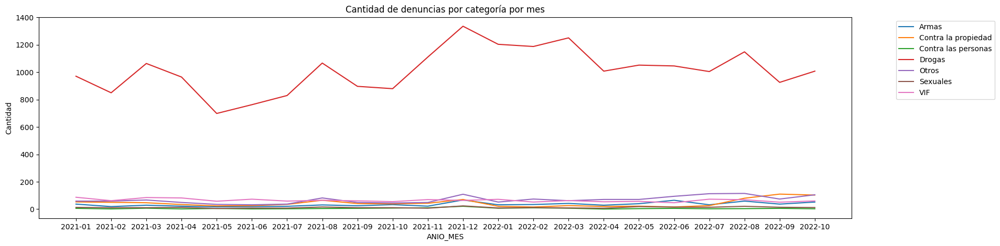

In [33]:
# generamos un gráfico de lineas mostrando la cantidad de datos en cada categoría por mes
if PROCESAR_TODO:
    # generamos columna con el mes de la denuncia
    df_denuncias['ANIO_MES'] = df_denuncias['FECHA_LLAMADA'].str.split('-').str[2] + '-' + df_denuncias['FECHA_LLAMADA'].str.split('-').str[1]
    # generamos un dataframe con la cantidad de datos por mes agrupado por categoría
    df_denuncias_mes = df_denuncias.groupby(['ANIO_MES','CATEGORIZACIÓN_SIMPLIFICADA']).size().reset_index(name='Cantidad')
    plt.figure(figsize=(20,5))
    sns.lineplot(data=df_denuncias_mes, x='ANIO_MES', y='Cantidad', hue='CATEGORIZACIÓN_SIMPLIFICADA')
    # mover leyenda fuera del grafico a la derecha
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.title('Cantidad de denuncias por categoría por mes')
    plt.show()
    plt.close()

<font color='Blue'>Se puede observar que la categoria Drogas es la que sufre más variación debido a su magnitud, las otras categorias, debido a su baja representatividad, no muestran grandes variaciones.  
El periodo con mayor cantidad de denuncias es el verano de 2022 (2021-12 a 2022-03), pudiendo ser por efecto de aumento de casos denunciables o aumento en difusión de la plataforma.

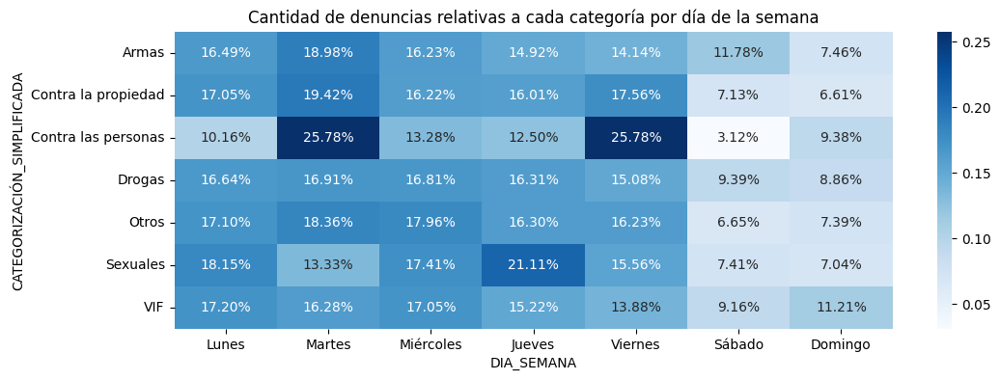

In [34]:
# revisamos la distribucion de cantidad de denuncias relativas a cada categoría por dia de la semana
if PROCESAR_TODO:
    # transformamos el campo fecha a datetime para facilitar su procesamiento
    df_denuncias['FECHA_LLAMADA'] = df_denuncias['FECHA_LLAMADA'].apply(faux.transformar_a_fecha)
    # generamos columna con el dia de la semana de la denuncia
    df_denuncias['DIA_SEMANA'] = df_denuncias['FECHA_LLAMADA'].dt.day_name()
    # cambiamos el nombre de los dias de la semana a español
    df_denuncias['DIA_SEMANA'] = df_denuncias['DIA_SEMANA'].replace({'Monday':'Lunes', 'Tuesday':'Martes', 'Wednesday':'Miércoles', 'Thursday':'Jueves', 'Friday':'Viernes', 'Saturday':'Sábado', 'Sunday':'Domingo'})
    # generamos un dataframe con la cantidad de datos por dia de la semana agrupado por categoría
    df_denuncias_dia = df_denuncias.groupby(['DIA_SEMANA','CATEGORIZACIÓN_SIMPLIFICADA']).size().reset_index(name='Cantidad')
    # calculamos la cantidad de denuncias relativas a cada categoría
    df_denuncias_dia['Cantidad_rel'] = df_denuncias_dia['Cantidad'] / df_denuncias_dia.groupby('CATEGORIZACIÓN_SIMPLIFICADA')['Cantidad'].transform('sum')
    # quitamos la CATEGORIZACIÓN SIMPLIFICADA No definido
    df_denuncias_dia = df_denuncias_dia[df_denuncias_dia['CATEGORIZACIÓN_SIMPLIFICADA'] != 'No definido']
    
    # generamos un grafico de calor con la cantidad de denuncias por dia de la semana y categoría
    plt.figure(figsize=(12,4))
    df_pivot = df_denuncias_dia.pivot('CATEGORIZACIÓN_SIMPLIFICADA', 'DIA_SEMANA',  'Cantidad_rel')
    # reordenar columnas
    df_pivot = df_pivot[['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']]
    _ = sns.heatmap(df_pivot, annot=True, fmt='.2%', cmap='Blues')
    plt.title('Cantidad de denuncias relativas a cada categoría por día de la semana')
    plt.show()
    plt.close()

<font color='Blue'>Con este gráfico es posible observar que las distribuciones de cantidad de denuncias relativas a cada categoria por dia de la semana son similares y no hay patrones marcados, excepto en delitos Contra las personas, pero al ser tan pocos registros, una variación pequeña causa grandes variaciones relativas.  
Se observa sin embargo que los fin de semana hay menor indice de denuncias que los dias laborales.

### 4.3 Eliminación de datos sensibles

In [35]:
#Se importan los archivos de stopwords y otras para poder eliminar informaciónn poco representativa para el objetivo
swe = stopwords.words('spanish')
swe.extend(faux.leer_cvs_to_list('listado_palabras/otras_palabras.csv'))
swe.extend(faux.leer_cvs_to_list('listado_palabras/listado_nombres_apellidos.csv'))
swe.extend(faux.leer_cvs_to_list('listado_palabras/tipos_calles.csv'))
swe.extend(faux.leer_cvs_to_list('listado_palabras/comunas.csv'))
swe.extend(faux.leer_cvs_to_list('listado_palabras/nombres_calles.csv'))
swe.extend(faux.leer_cvs_to_list('listado_palabras/regiones_chile.csv'))
swe = [x.lower().strip() for x in swe]

In [36]:
#Se aplica la función text_processor a la columna Glosa y se genera un nueva columna con el resultado
if os.path.exists('serializados/dataframe_denuncias.pkl'):
    df_denuncias = pkl.load(open('serializados/dataframe_denuncias.pkl', 'rb'))
else:
    df_denuncias['GLOSA_PROCESADA']=df_denuncias['GLOSA'].apply(faux.text_preprocessor,stopwords=swe)
    pkl.dump(df_denuncias, open('serializados/dataframe_denuncias.pkl', 'wb'))

In [37]:
#Se comprueba con un registro la aplicación de la función que procesa y limpia la Glosa
df_denuncias['GLOSA_PROCESADA'][2]

'trafico drogas ciudadanos colombianos'

<font color='Blue'> Se comprueba que la función procesó y limpió la glosa, tal como se tenía previsto.

In [38]:
#Observamos los cambios generados
df_denuncias.sample(5)

,GLOSA,FECHA_LLAMADA,ESTADO,COD_COM,COMUNA,CATEGORIZACIÓN_SIMPLIFICADA,ANIO_MES,DIA_SEMANA,GLOSA_PROCESADA
18052,"PRESUNTO DELITO DE VIOLENCIA INTRAFAMILIAR, NO...",2022-02-15,Derivado,13109.0,La Cisterna,VIF,2022-02,Martes,violencia intrafamiliar flagrante conviviente
26941,PRESUNTO MICROTRÁFICO DE MARIHUANA PROCESADA Y...,2022-08-12,Denuncia jurídica,13123.0,Providencia,Drogas,2022-08,Viernes,microtrafico marihuana procesada cb levtraoro ...
16694,PRESUNTO MICROTRÁFICO DE CLORHIDRATO DE COCAÍN...,2022-01-19,Denuncia jurídica,13108.0,Independencia,Drogas,2022-01,Miércoles,microtrafico clorhidrato cocaina cocaina base ...
24383,"PRESUNTO MICROTRÁFICO DE MARIHUANA PROCESADA, ...",2022-06-20,Denuncia Jurídica,13126.0,Quinta Normal,Drogas,2022-06,Lunes,microtrafico marihuana procesada cocaina base ...
9926,"PRESUNTO MICROTRÁFICO DE DROGAS, SE IGNORA TIP...",2021-08-30,Denuncia jurídica,13129.0,Collipulli,Drogas,2021-08,Lunes,microtrafico drogas familiar


<font color='Blue'> Los cambios realizados se agregaron a una nueva columna, la cual queda al final de la tabla. Es por ello que reordenaremos la tabla, quedando la nueva columna creada *'glosa_procesada'* quede en un principio de nuestra tabla.

In [39]:
#Ordenamos las columnas
df_denuncias_procesadas = df_denuncias.reindex(columns=['GLOSA_PROCESADA','GLOSA','FECHA_LLAMADA','ESTADO','COD_COM','COMUNA', 'CATEGORIZACIÓN_SIMPLIFICADA', 'ANIO_MES', 'DIA_SEMANA'])

In [40]:
#Observamos los cambios generados
df_denuncias_procesadas.sample(5)

,GLOSA_PROCESADA,GLOSA,FECHA_LLAMADA,ESTADO,COD_COM,COMUNA,CATEGORIZACIÓN_SIMPLIFICADA,ANIO_MES,DIA_SEMANA
991,microtrafico marihuana procesada clorhidrato c...,"PRESUNTO MICROTRÁFICO DE MARIHUANA PROCESADA, ...",2021-01-24,Aprobado,13130.0,San Miguel,Drogas,2021-01,Domingo
20563,robo intimidacion nacho galte,"INS. PRESUNTO DELITO DE ROBO CON INTIMIDACIÓN,...",2022-04-01,Rechazado,13119.0,Maipú,Contra la propiedad,2022-04,Viernes
5181,hallazgo vehiculo encargo policial,PRESUNTO HALLAZGO DE VEHICULO CON ENCARGO POLI...,2021-04-23,Derivado,9101.0,Temuco,Otros,2021-04,Viernes
8746,falsificacion uso malicioso documentos privado...,PRESUNTA FALSIFICACION Y USO MALICIOSO DE DOCU...,2021-08-06,Denuncia jurídica,13201.0,Puente Alto,Otros,2021-08,Viernes
29432,microtrafico metanfetamina lsd extasis,W20221002214444026 - PRESUNTO MICROTRÁFICO DE ...,2022-10-02,Denuncia jurídica,13127.0,Recoleta,Drogas,2022-10,Domingo


<font color='Blue'> Se realizarón los cambios correctamente.
**Debido a que la columna 'GLOSA' posee datos sensibles, la eliminaremos y nos quedaremos con la columna 'GLOSA_PROCESADA', ya que esta contiene los datos procesados, tal como lo indica su nombre.**

In [41]:
#Eliminamos la columna 'GLOSA'
#Eliminamos columnas que no utilizaremos en este proyecto
df_denuncias_procesadas = df_denuncias_procesadas.drop(['GLOSA'], axis=1)

In [42]:
#Observamos los cambios generados
df_denuncias_procesadas.sample(5)

,GLOSA_PROCESADA,FECHA_LLAMADA,ESTADO,COD_COM,COMUNA,CATEGORIZACIÓN_SIMPLIFICADA,ANIO_MES,DIA_SEMANA
5166,microtrafico cocaina base marihuana conviviente,2021-04-23,Denuncia jurídica,13122.0,Peñalolén,Drogas,2021-04,Viernes
20251,microtrafico clorhidrato cocaina marihuana pro...,2022-03-27,Denuncia jurídica,8106.0,Lota,Drogas,2022-03,Domingo
29556,defraudacion sexo masculino,2022-10-04,Rechazado,13123.0,Providencia,Contra la propiedad,2022-10,Martes
10076,microtrafico cocaina base marihuana procesada ...,2021-09-02,Denuncia jurídica,8103.0,Chiguayante,Drogas,2021-09,Jueves
15498,microtrafico marihuana procesada clorhidrato c...,2021-12-28,Denuncia jurídica,5101.0,Valparaíso,Drogas,2021-12,Martes


<font color='Blue'> Se realizaron los cambios correctamente.

### 4.4 Frecuencia de palabras

In [43]:
# generamos un diccionario con palabras y frecuencias para generar una nube de palabras
# generamos una lista con todas las palabras de la columna GLOSA
lista_palabras = df_denuncias_procesadas['GLOSA_PROCESADA'].str.split().tolist()
# generamos una lista con todas las palabras de la lista anterior
lista_palabras = [item for sublist in lista_palabras for item in sublist]
# generamos un diccionario con las palabras y su frecuencia
diccionario_palabras = faux.contar_frecuencia(lista_palabras)

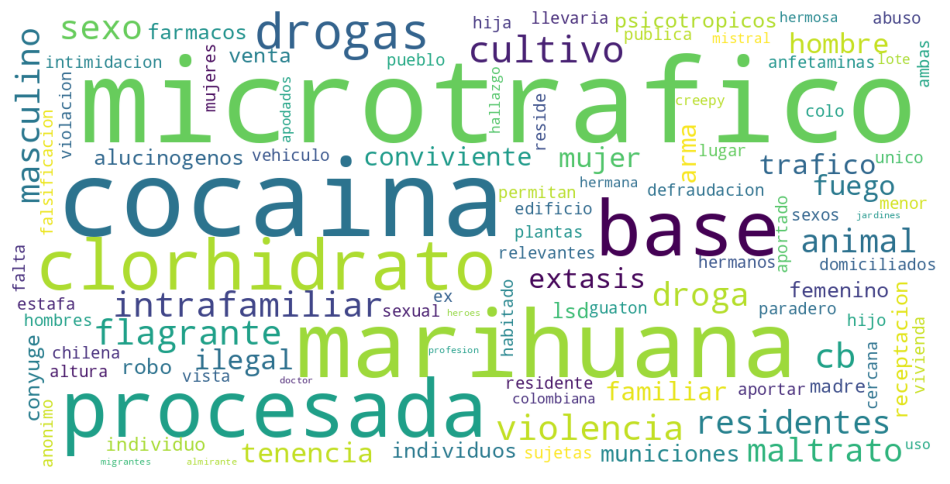

In [44]:
# generamos una nube de palabras con las palabras mas frecuentes
if PROCESAR_TODO:
    wordcloud = WordCloud(
        background_color='white',
        max_words=100,
        max_font_size=50,
        scale=3,
        random_state=RANDOM_SEED).generate_from_frequencies(diccionario_palabras)
    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    plt.imshow(wordcloud)
    plt.show()
    plt.close()

<font color='Blue'>En la nube de palabras se pueden ver relacionadas al tipo de delito con mayor denuncia, que es *Drogas*; *Microtrafico*, *Cocaina*, *base*, *clorhidrato*.

In [45]:
# se procean los datos para generar frecuencias de palabras mas repetidas por cada categoria
cantidad_palabras = 30
if PROCESAR_TODO:
    # generamos un listado con las categorias de denuncias
    lista_categorias = df_denuncias_procesadas['CATEGORIZACIÓN_SIMPLIFICADA'].unique().tolist()
    # generamos un diccionario con palabras y frecuencias para cada categoria de denuncia
    diccionario_palabras_categorias = {}
    for categoria in lista_categorias:
        # generamos una lista con todas las palabras de la columna GLOSA para la categoria
        lista_palabras = df_denuncias_procesadas[df_denuncias_procesadas['CATEGORIZACIÓN_SIMPLIFICADA'] == categoria]['GLOSA_PROCESADA'].str.split().tolist()
        # generamos una lista con todas las palabras de la lista anterior
        lista_palabras = [item for sublist in lista_palabras for item in sublist]
        # generamos un diccionario con las palabras y su frecuencia
        diccionario_palabras_categorias[categoria] = faux.extraer_mas_frecuentes(faux.contar_frecuencia(lista_palabras), cantidad_palabras)

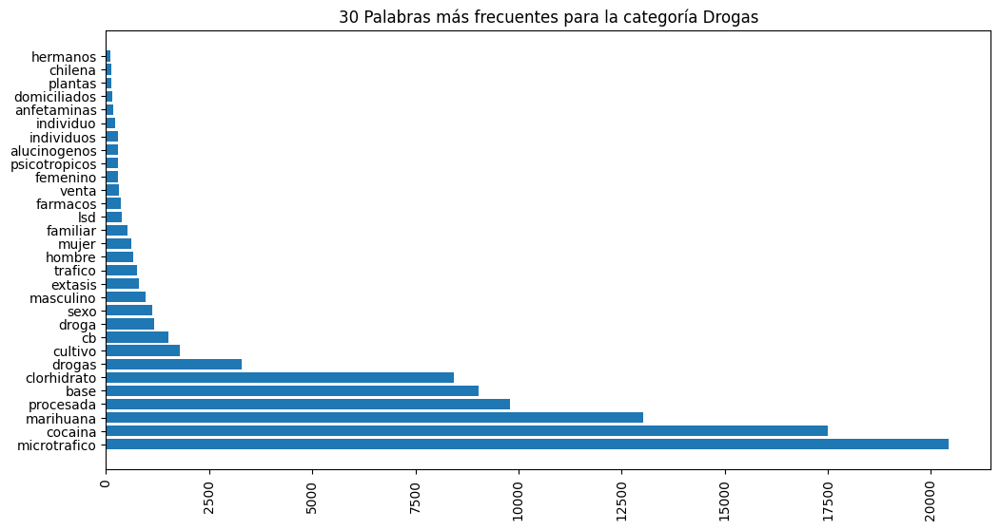

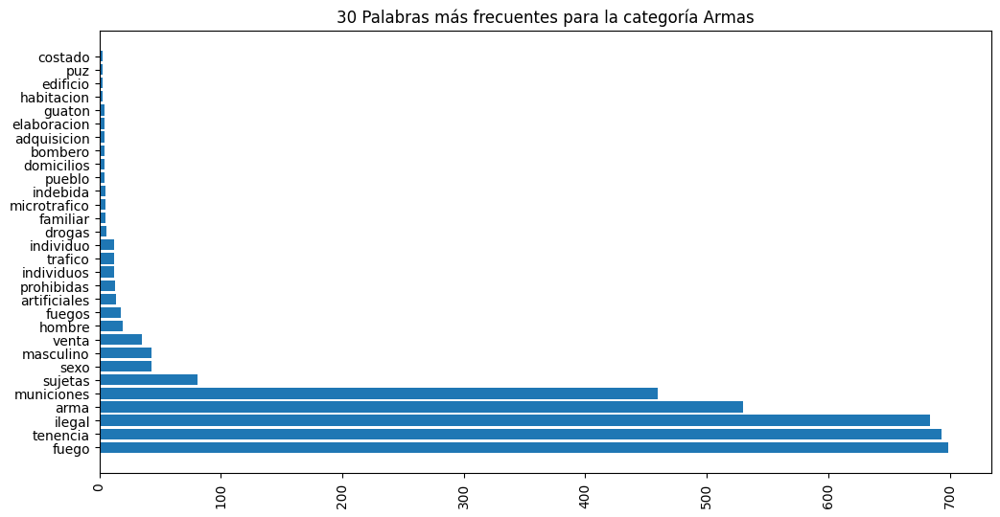

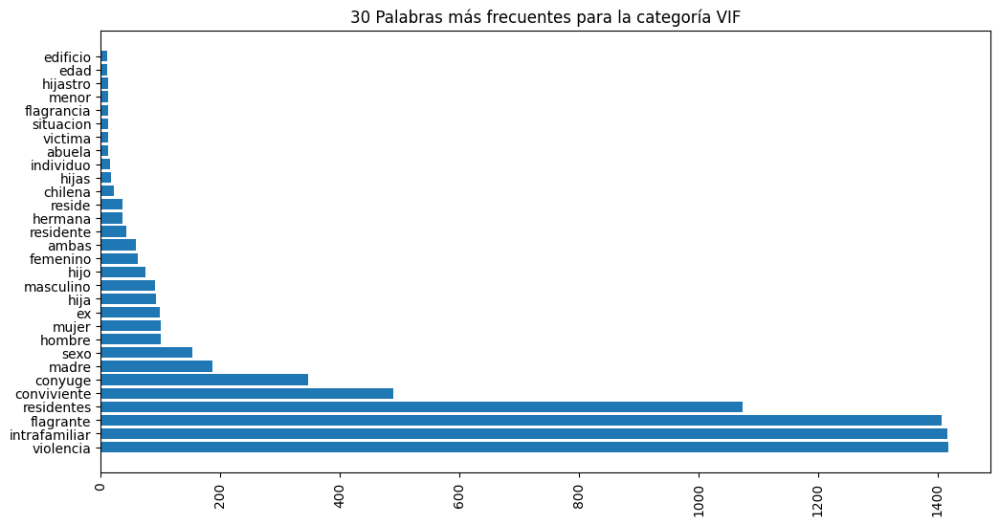

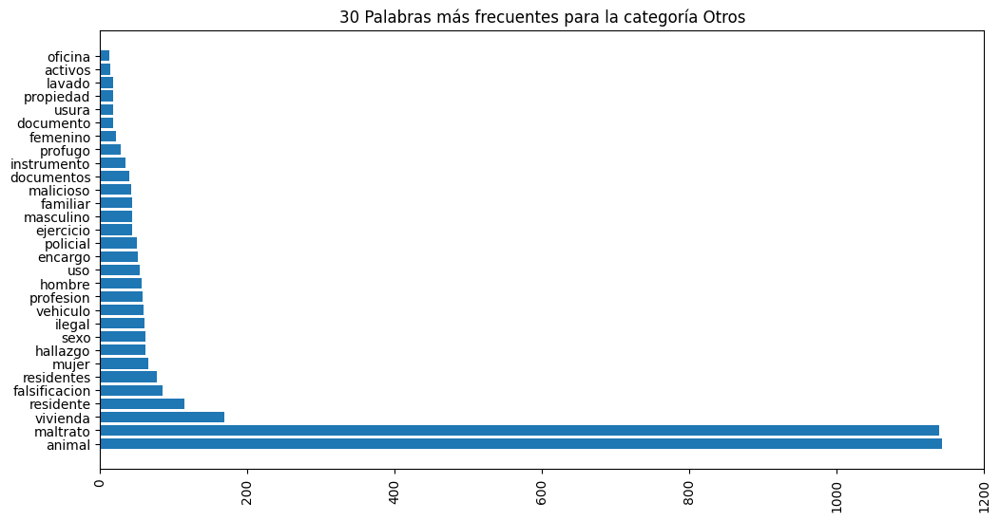

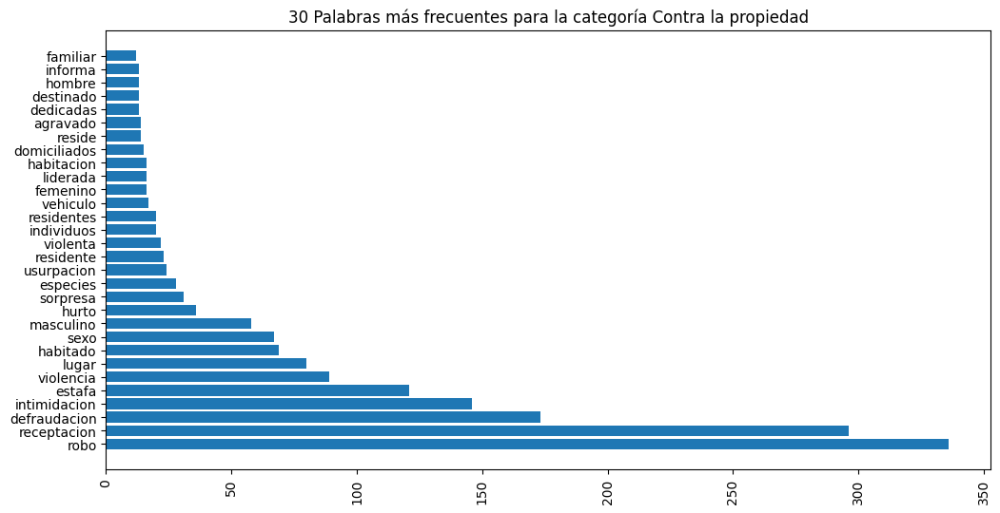

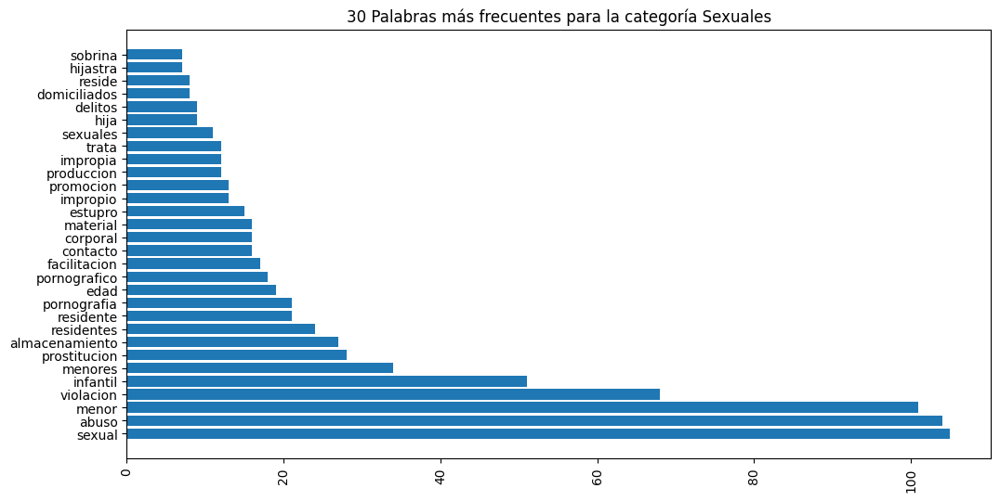

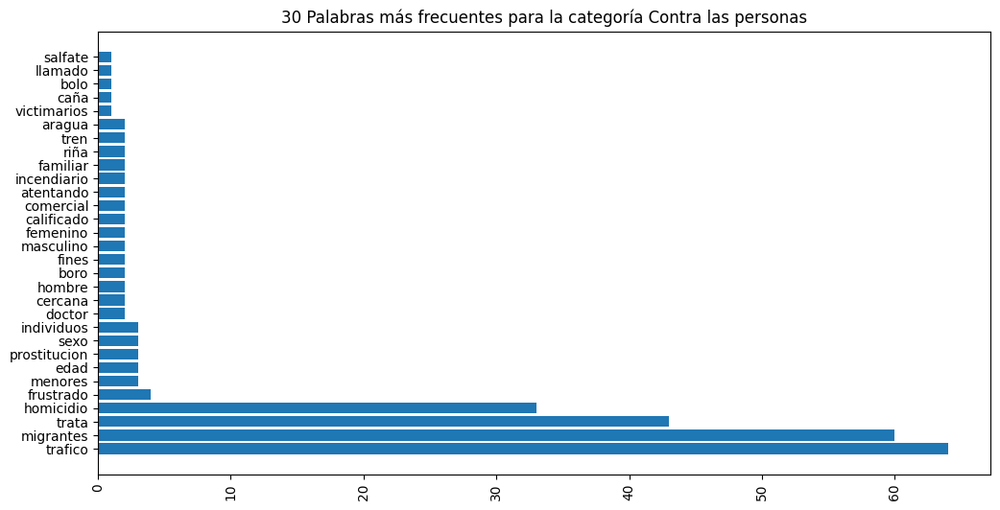

In [46]:
# graficamos las palabras mas frecuentes para cada categoria de denuncia con grafico de barras horizontales
if PROCESAR_TODO:
    for categoria, diccionario in diccionario_palabras_categorias.items():
        if categoria == 'No definido':
            continue
        plt.figure(figsize=(12,6))
        plt.title(f'{cantidad_palabras} Palabras más frecuentes para la categoría {categoria}')
        plt.barh(*zip(*diccionario.items()))
        plt.xticks(rotation=90)
        plt.show()
        plt.close()

<font color='Blue'> 

Se observan en todas las categorias, palabras claves del delito denunciado.

Para el caso de **Drogas**, las 5 palabras más frecuentes son:
    - *Microtrafico, Cocaina, Marihuana, Procesada, Base*.

Para el caso de **Armas**, las 5 palabras más frecuentes son:
    - *Fuego, Tenencia, Ilegal, Arma, Municiones*.

Para el caso de **Contra la propiedad**, las 5 palabras más frecuentes son:
    - *Robo, Receptación, Defraudación, Intimidación, Estafa*.

Para el caso de **Sexuales**, las 5 palabras más frecuentes son:
    - *Sexual, Abuso, Menor, Violación, Infantil*.

Para el caso de **Otros**, las 5 palabras más frecuentes son:
    - *Animal, Maltrato, Vivienda, Residente, Falsificación*.

Para el caso de **VIF**, las 5 palabras más frecuentes son:
    - *Violencia, Intrafamiliar, Flagrante, Residente, Conviviente*.

Para el caso de **Contra las personas**, las 5 palabras más frecuentes son:
    - *Trafico, Migrantes, Trata, Homicidio, Frustrado*.



______________

## <font color='MediumSeaGreen'>Sección 5: **Feature Engineering**

In [47]:
# # Vectorización de GLOSA_PROCESADA
count_vectorizer = CountVectorizer(preprocessor=None)
matrix_dispersa = count_vectorizer.fit_transform(df_denuncias_procesadas['GLOSA_PROCESADA'])

In [48]:
#Se le otorga un número a cada clase
label_encoder = LabelEncoder()
df_denuncias_procesadas['CATEGORIZACIÓN_SIMPLIFICADA'] = label_encoder.fit_transform(df_denuncias_procesadas['CATEGORIZACIÓN_SIMPLIFICADA'])
df_denuncias_procesadas['CATEGORIZACIÓN_SIMPLIFICADA'].value_counts()

3    22271
4     1503
6     1419
1      968
0      764
5      270
2      128
Name: CATEGORIZACIÓN_SIMPLIFICADA, dtype: int64

<font color='Blue'>Le otorgamos número a cada clase: 
- <font color='Blue'>**0** = *'Armas'*.
- <font color='Blue'>**1** = *'Contra la propiedad'*.
- <font color='Blue'>**2** = *'Contra las personas'*.
- <font color='Blue'>**3** = *'Drogas'*.
- <font color='Blue'>**4** = *'Otros'*.
- <font color='Blue'>**5** = *'Sexuales'*.
- <font color='Blue'>**6** = *'VIF'*.

In [49]:
# Separación de muestras entre muestra de entrenamiento y validación
X = matrix_dispersa #df_denuncias_procesadas['GLOSA_PROCESADA']
y = df_denuncias_procesadas['CATEGORIZACIÓN_SIMPLIFICADA']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = RANDOM_SEED)

________

## <font color='MediumSeaGreen'>Sección 6.- **Modelación del Vector Objetivo** </font>


Definiremos los nombres de cada clase en una constante denominada *'target_names'*

In [50]:
#Definiremos los nombres de cada clase en una constante
target_names = ['Armas', 'Contra la propiedad', 'Contra las personas', 'Drogas', 'Otros','Sexuales', 'VIF']

### 6.1 Regresión Logística

La regresión logística es un modelo estadístico que permite predecir valores de una variable categórica basandose en otras variables independientes.
Corresponde al conjunto de modelos lineales generalizados, y utiliza como función de enlace la funcion logit.
En este modelo se asume que hay linealidad entre los log-odds (logaritmo de la oportunidad) de la varible objetivo y cada varible independiente, por lo tanto no contempla casos de relaciones de segundo orden o superior. Lo que para nuestro caso es correcto, ya que se asume que la frecuncia de las palabras tiene una relación lineal con la probailidad de cada clase.

Definimos la formula matemática para regresión logistica multinomial de la siguiente manera.
$$
\hat{p}_k(X_i) = \frac{\exp(X_i W_k + W_{0, k})}{\sum_{l=0}^{K-1} \exp(X_i W_l + W_{0, l})}.
$$


Algunas características de este modelo:
- Tener clases desbalanceadas hace que el modelo ajustado se vea altamente influenciado por la gran cantidad de elementos de la clase mayoritaria durante el ajuste por verosimilitud.
- Requiere independencia entre los ejemplos de la muestra, es decir, los ejemplos en la matriz 𝑋 no pueden venir de remuestreos donde se dupliquen los ejemplos
Estas características puede influir en casos que la variación de las variables explican todas las clases. para nuestro caso, asumimos que hay conjuntos de variables (palabras claves) que explican cada clase por separado, por lo que no interfieren en entre ellas.
 
Para este caso decidimos utilizar los siguientes hiperparametros:
- **solver**: algoritmo utilizado para la optimización del modelo. Se utiliza SAGA por permitir multiclases y estar optimizado para grandes conjustos de datos.
- **multi_class**: opciones de mecanismos de calculos
	- ovr (one vs rest): uno contra todos, se realiza el ajuste como problemas binomiales para cada categoria
	- multinomial: se ajusta mediante perdida multinomial
- **penalty**: opciones regularización para evitar sobreajuste de variables
- **c_values**: listado de coeficientes de regularización. Mienstras más pequeño, más fuerte la regularización
- **class_weiht**: opción para equilibrar las clases desbalanceadas ponderando inversamente por su frecuencia.

<center><img src="Imagenes/Regresion_logistica_1.png"  /></center>   

<font color='Blue'>Los mejores parametros son:
* *<font color='Blue'>Mejor: 0.996176 usando {'C': 1.0, 'class_weight': 'balanced', 'multi_class': 'ovr', 'penalty': 'l1', 'solver': 'saga'}*
* <font color='Blue'>Procesado en 2673.785s


In [51]:
# se genera y entrena el mejor modelo en base a los parametros encontrados
# el proceso se realiza solo si el modelo no se encuentra ya serializado. Esto para ahorrar tiempo al reprocesar
regresionlogistica_model_path = 'serializados/regresionlogistica_model.pkl'
if os.path.exists(regresionlogistica_model_path):
    logmodel_best = pkl.load(open(regresionlogistica_model_path, 'rb'))
else:
    logmodel_best = LogisticRegression(random_state=RANDOM_SEED, solver='saga', multi_class='ovr', C=1, penalty='l1', class_weight='balanced').fit(X_train, y_train)
    pkl.dump(logmodel_best, open(regresionlogistica_model_path, 'wb'))

In [52]:
#se genera la predicción de las clases y de la probabilidad
y_hat_log = logmodel_best.predict(X_test)

In [53]:
#métricas de precisión, recall y f1-score para ambas clases
print(classification_report(y_test, y_hat_log, target_names=target_names))

                     precision    recall  f1-score   support

              Armas       0.98      0.98      0.98       252
Contra la propiedad       0.98      0.98      0.98       304
Contra las personas       0.89      0.87      0.88        46
             Drogas       1.00      1.00      1.00      7290
              Otros       0.98      0.99      0.98       535
           Sexuales       0.98      0.94      0.96        99
                VIF       1.00      1.00      1.00       491

           accuracy                           1.00      9017
          macro avg       0.97      0.96      0.97      9017
       weighted avg       1.00      1.00      1.00      9017




#### <font color='Blue'>Para Regresión Logistica se observan las siguientes métricas:

<font color='Blue'>**El modelo tiene un accuracy de**:

- <font color='Blue'>100%

<font color='Blue'>**El modelo tiene una precisión de:**
- <font color='Blue'>98% para la categoría "Armas"
- <font color='Blue'>98% para la categoría "Contra la propiedad"
- <font color='Blue'>89% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>98% para la categoría "Otros"
- <font color='Blue'>98% para la categoría "Sexuales"
- <font color='Blue'>100% para la categoría "VIF"

<font color='Blue'>**El modelo tiene una sensibilidad(recall) de:**

- <font color='Blue'>98% para la clase categoría "Armas"
- <font color='Blue'>98% para la clase la categoría "Contra la propiedad"
- <font color='Blue'>87% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>99% para la categoría "Otros"
- <font color='Blue'>94% para la categoría "Sexuales"
- <font color='Blue'>100% para la categoría "VIF"

<font color='Blue'>**El modelo tiene un f1-score(media armonica entre pres. y sensibilidad) de:**

- <font color='Blue'>98% para la clase categoría "Armas"
- <font color='Blue'>98% para la clase la categoría "Contra la propiedad"
- <font color='Blue'>88% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>98% para la categoría "Otros"
- <font color='Blue'>96% para la categoría "Sexuales"
- <font color='Blue'>100% para la categoría "VIF"

## 6.2 Multinomial Naive Bayes

Naive Bayes es un algoritmo de aprendizaje automático que se utiliza en el análisis de datos y en el aprendizaje automático. Está basado en la teoría de probabilidad y en la suposición de independencia entre los atributos de una muestra. Dicho de otro modo, se asume que los atributos de una muestra no están relacionados entre sí y que cada uno aporta información única y independiente al resultado final.

La principal ventaja de Naive Bayes es que es un algoritmo simple y fácil de implementar, esto lo hace ideal para trabajar con conjuntos de datos grandes y complejos. Además, es muy eficiente en términos de tiempo de procesamiento, lo que lo convierte en una buena opción para aplicaciones en tiempo real.

En resumen, Naive Bayes es un algoritmo de aprendizaje automático utilizado para clasificar datos utilizando la teoría de la probabilidad y la suposición de independencia entre los atributos de una muestra.

**Terorema de Bayes:**

$$
Pr(Aposteriori) = \dfrac{Pr(Verosimilitud) x Pr(A priori)}{Pr(Evidencia)}
$$

**A posteriori:** ¿Qué necesitamos saber?
**Verosimilitud:** La información que asumimos y a la cual tenemos conocimiento sobre su ocurrencia.
**A priori:** La probabilidad previa de ocurrencia de nuestro evento de interés. Puede afectar de manera substancial a la verosimilitud.
**Evidencia:** Evidencia existente sobre el fenómeno condicionante.

Para este caso decidimos utilizar los siguientes hiperparametros:

**1. alpha:** Añade un parámetro aditivo a la probabilidad 𝑃𝑟(𝑋 . Esta adición permite 𝑘|𝑦) superar el problema del floating point underflow cuando nos encontramos con probabilidades 𝑃𝑟(𝑋 . Cuando alpha=1, se llama suavización de Laplace y 𝑘|𝑦) = 0 cuando alpha es un decimal entre 0 y 1 se conoce como suavización de Lidstone. ***alpha: 0.8***

**2. binarize:** Implementado cuando los atributos son continuos y se necesita declarar un umbral para la binarización.

**3. fit_prior:** Por defecto calcula la probabilidad a priori de cada clase en la muestra de entrenamiento. Si es False, asume una distribución uniforme en base a 1/𝑁𝑦∈𝑌.***'fit_prior: False***

**4. class_prior:** Permite ingresar la probabilidad a priori para cada clase en el algoritmo de entrenamiento. Por defecto es None.

<center><img src="Imagenes/MultinomialNB_1.png"  /></center>

<font color='Blue'>Los mejores parametros son: 
* *<font color='Blue'>Mejor: 0.994756 usando {'alpha': 0.6, 'fit_prior': False}*
* <font color='Blue'>Procesado en 1.028s





In [54]:
# se genera y entrena el mejor modelo en base a los parametros encontrados
# el proceso se realiza solo si el modelo no se encuentra ya serializado. Esto para ahorrar tiempo al reprocesar
naivebayes_model_path = 'serializados/naivebayes_model.pkl'
if os.path.exists(naivebayes_model_path):
    nb_model_best = pkl.load(open(naivebayes_model_path, 'rb'))
else:
    nb_model_best = MultinomialNB(alpha=0.6, fit_prior=False).fit(X_train, y_train)
    pkl.dump(nb_model_best, open(naivebayes_model_path, 'wb'))

In [55]:
#se genera la predicción de las clases y de la probabilidad
y_hat_nb = nb_model_best.predict(X_test)

In [56]:
#métricas de precisión, recall y f1-score para ambas clases
print(classification_report(y_test, y_hat_nb, target_names=target_names))

                     precision    recall  f1-score   support

              Armas       0.96      0.99      0.97       252
Contra la propiedad       0.95      0.96      0.95       304
Contra las personas       0.79      0.89      0.84        46
             Drogas       1.00      1.00      1.00      7290
              Otros       0.99      0.98      0.98       535
           Sexuales       0.94      0.94      0.94        99
                VIF       0.99      1.00      0.99       491

           accuracy                           0.99      9017
          macro avg       0.95      0.96      0.95      9017
       weighted avg       0.99      0.99      0.99      9017



<font color='Blue'>El modelo Multinomial Naives Bayes es un tipo de modelo de clasificación por medio de las probabilidades de cada categoría, visualizamos un f1-score en promedio de 0.96, generando la mejor predicción en categoría "Drogas" y la predicción más baja fue en la categoría "Contra las personas".

#### <font color='Blue'> Para *Multinomial Naive Bayes* se observan las siguientes métricas:

<font color='Blue'>**El modelo tiene un accuracy de:** 
- <font color='Blue'>99%
    
<font color='Blue'>**El modelo tiene una precisión de:** 
- <font color='Blue'>96% para la categoría "Armas"
- <font color='Blue'>95% para la categoría "Contra la propiedad"
- <font color='Blue'>79% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>99% para la categoría "Otros"
- <font color='Blue'>94% para la categoría "Sexuales"
- <font color='Blue'>99% para la categoría "VIF"

<font color='Blue'>**El modelo tiene una sensibilidad(recall) de**:
- <font color='Blue'>99% para la clase categoría "Armas"
- <font color='Blue'>96% para la clase la categoría "Contra la propiedad"
- <font color='Blue'>89% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>98% para la categoría "Otros"
- <font color='Blue'>94% para la categoría "Sexuales"
- <font color='Blue'>100% para la categoría "VIF"

<font color='Blue'>**El modelo tiene un f1-score(media armonica entre pres. y sensibilidad) de**:
- <font color='Blue'>97% para la clase categoría "Armas"
- <font color='Blue'>95% para la clase la categoría "Contra la propiedad"
- <font color='Blue'>84% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>98% para la categoría "Otros"
- <font color='Blue'>94% para la categoría "Sexuales"
- <font color='Blue'>99% para la categoría "VIF"

### 6.3 Support Vector Machine (SVM)

Las máquinas de vectores de soporte o máquinas de vector soporte (del inglés support-vector machines, SVM) son un conjunto de algoritmos de aprendizaje supervisado.
Estos métodos están propiamente relacionados con problemas de clasificación y regresión. Dado un conjunto de ejemplos de entrenamiento (de muestras) podemos etiquetar las clases y entrenar una SVM para construir un modelo que prediga la clase de una nueva muestra. Intuitivamente, una SVM es un modelo que representa a los puntos de muestra en el espacio, separando las clases a 2 espacios lo más amplios posibles mediante un hiperplano de separación definido como el vector entre los 2 puntos, de las 2 clases, más cercanos al que se llama vector soporte. Cuando las nuevas muestras se ponen en correspondencia con dicho modelo, en función de los espacios a los que pertenezcan, pueden ser clasificadas a una o la otra clase.
Más formalmente, una SVM construye un hiperplano o conjunto de hiperplanos en un espacio de dimensionalidad muy alta (o incluso infinita) que puede ser utilizado en problemas de clasificación o regresión. Una buena separación entre las clases permitirá una clasificación correcta.

**Obtención del plano:**

$$
\{ x : f(x) = X^T\beta+\beta_0 =0\}
$$

****El plano satisface una función lineal.***

Explicación y elección de hiperparametros:

**Kernel:** es la función encargada de transformar y procesar nuestros datos, hay distintos tipos:
-    **linear:** nos ayuda a realizar predicciones cuando nuestros datos son linealmente ajustables, como los de la imagen superior, por lo que tendremos una función lineal.
-    **poly:** este Kernel se encarga de transformar nuestros datos a un espacio dimensional N (donde N es el número de dimensiones que nosotros fijemos) de tal forma que al ir añadiendo dimensiones, llegaremos a una, en la que nuestros datos son linealmente separables. Una vez hecho esto, devuelve los datos a su dimensión normal.
-    **rbf:** Radial Basis Function, usada también en las redes neuronales, es usada cuando nuestros datos no son linealmente separables, sobre todo cuando estás representados en formas circulares.
-    **sigmoid:** la menos usada, es similar a la regresión logística.

***Elección: rbf***

**C:** resumiendo de una manera simple, consiste en cuanto permitimos al algoritmo que clasifique puntos mal, con el objetivo de reducir la complejidad del algoritmo. Cuanto más alto es C, más pequeños son los vectores soporte y por tanto más complejo es el modelo.

***Elección= [C: 1.0]***

**Gamma:** solo funciona con los kernels no lineales, como rbf y sigmoid. Es como de “fuerte” queremos que ajuste nuestro algoritmo, más alto el número, más probabilidad de sobre-ajuste.

***Elección= [gamma: scale]***


<center><img src="Imagenes/SVM_1.png"  /></center>

<font color='Blue'>Los mejores parametros son: 
* <font color='Blue'>*Mejor: 0.994264 usando {'C': 1.0, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'rbf'}*
* <font color='Blue'>Procesado en 715.099s

In [57]:
# se genera y entrena el mejor modelo en base a los parametros encontrados
# el proceso se realiza solo si el modelo no se encuentra ya serializado. Esto para ahorrar tiempo al reprocesar
svm_model_path = 'serializados/svm_model.pkl'
if os.path.exists(svm_model_path):
    svm_best = pkl.load(open(svm_model_path, 'rb'))
else:
    svm_best = SVC(kernel='rbf',C=1.0, gamma='scale' ,class_weight='balanced', random_state=RANDOM_SEED, probability=True).fit(X_train, y_train)
    pkl.dump(svm_best, open(svm_model_path, 'wb'))

In [58]:
#se genera la predicción de las clases y de la probabilidad
y_hat_svm = svm_best.predict(X_test)

In [59]:
#métricas de precisión, recall y f1-score para ambas clases
print(classification_report(y_test, y_hat_svm, target_names=target_names))

                     precision    recall  f1-score   support

              Armas       1.00      0.97      0.98       252
Contra la propiedad       0.98      0.96      0.97       304
Contra las personas       0.91      0.85      0.88        46
             Drogas       1.00      1.00      1.00      7290
              Otros       0.97      0.99      0.98       535
           Sexuales       0.98      0.93      0.95        99
                VIF       1.00      0.99      1.00       491

           accuracy                           0.99      9017
          macro avg       0.98      0.95      0.96      9017
       weighted avg       0.99      0.99      0.99      9017



#### <font color='Blue'>Para Suport Vector Machine se observan las siguientes métricas:
<font color='Blue'>**El modelo tiene un accuracy de**:
- <font color='Blue'>99%
<font color='Blue'>**El modelo tiene una precisión de:**

- <font color='Blue'>100% para la categoría "Armas"
- <font color='Blue'>98% para la categoría "Contra la propiedad"
- <font color='Blue'>91% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>97% para la categoría "Otros"
- <font color='Blue'>98% para la categoría "Sexuales"
- <font color='Blue'>100% para la categoría "VIF"

<font color='Blue'>**El modelo tiene una sensibilidad(recall) de:**

- <font color='Blue'>97% para la clase categoría "Armas"
- <font color='Blue'>96% para la clase la categoría "Contra la propiedad"
- <font color='Blue'>85% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>99% para la categoría "Otros"
- <font color='Blue'>93% para la categoría "Sexuales"
- <font color='Blue'>99% para la categoría "VIF"

<font color='Blue'>**El modelo tiene un f1-score(media armonica entre pres. y sensibilidad) de:**

- <font color='Blue'>98% para la clase categoría "Armas"
- <font color='Blue'>97% para la clase la categoría "Contra la propiedad"
- <font color='Blue'>88% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>98% para la categoría "Otros"
- <font color='Blue'>95% para la categoría "Sexuales"
- <font color='Blue'>100% para la categoría "VIF"

### 6.4 XGBoost

XGBoost es un método de aprendizaje automático supervisado para clasificación.

Este método se basa en en un ensamblado secuencial de árboles de decisión,estos agregan secuencialmente a fin de aprender del resultado de los árboles previos y corregir el error producido por los mismos, hasta que ya no se pueda corregir más dicho error. También penaliza la complejidad de los modelos y evita el sobreajuste o sesgo que pudiese ocurrir.

XGBoost funciona bien cuando tenemos una base de datos de gran tamaño, complejo y de multiples variables, esto se debe a que este metodo utiliza varios métodos de optimización. De igual manera puede manejar valores perdidos y data desbalanceada. Por lo dicho anteriormente, nos es muy útil utilizar XGboost coon nuestra data, ya que contamops con 7 categorias y más de mil datos.

Definimos matematicamente XGBoost de la siguiente manera:

$$
\mathcal{L^t} = \sum_{i=1}^{n} \iota (y_i, \hat{y}_i^{(t-1)} + f_t (x_i))+ \Omega(f_t)
$$

Para este caso decidimos utilizar los siguientes hiperparametros:
- '**max_depth**'= Corresponde a la profundidad máxima de un árbol. Al aumentar este valor hará que el modelo sea más complejo y más propenso a sobreajuste. Es por ello que utilizamos el siguiente rango: ***range (8, 10, 2)***.

- '**n_estimators**'= Corresponde a el número de árboles (o rondas) en un modelo. Para este caso utilizamos el siguiente rango: ***range(130, 240, 20)***.

- '**learning_rate**'= Corresponde a la reducción del tamaño del paso utilizado en la actualización para evitar el sobreajuste. Después de cada paso de refuerzo, podemos obtener directamente los pesos de las nuevas características, y *learning_rate* reduce los pesos de las características para que el proceso de refuerzo sea más conservador. Para este caso utilizamos 2 series de valores a evaluar: ***[0.3, 0.1]***.

- '**subsample**'= Corresponde a la proporción de submuestreo de las instancias de entrenamiento. En este caso establecimos ***[0.5]***, ya que muestreará aleatoriamente la mitad de los datos de entrenamiento antes de hacer crecer los árboles, lo que evitará el sobreajuste.

- **'multi:softmax'**: establece XGBoost para realizar una clasificación multiclase utilizando el objetivo softmax, también es necesario establecer num_class(número de clases)

<center><img src="Imagenes/XGBoost_1.png"  /></center>

<font color='Blue'>Los mejores parametros son:
* <font color='Blue'>*Mejor: usando {'learning_rate': 0.2, 'max_depth': 8, 'n_estimators': 130, 'subsample': 0.5}*
* <font color='Blue'>Procesado en 2743.570s




In [60]:
# se genera y entrena el mejor modelo en base a los parametros encontrados
# el proceso se realiza solo si el modelo no se encuentra ya serializado. Esto para ahorrar tiempo al reprocesar
xgboost_model_path = 'serializados/xgboost_model.pkl'
if os.path.exists(xgboost_model_path):
    xgboost_model = pkl.load(open(xgboost_model_path, 'rb'))
else:
    xgboost_model = XGBClassifier(learning_rate=0.2, max_depth=8, n_estimators=130, subsample=0.5, seed=RANDOM_SEED).fit(X_train, y_train)
    pkl.dump(xgboost_model, open(xgboost_model_path, 'wb'))

In [61]:
#Se genera la predicción de las clases y de la probabilidad
y_hat_xgb = xgboost_model.predict(X_test)

#métricas de precisión, recall y f1-score para las clases
print(classification_report(y_test, y_hat_xgb, target_names=target_names))

                     precision    recall  f1-score   support

              Armas       0.98      0.98      0.98       252
Contra la propiedad       0.99      0.96      0.97       304
Contra las personas       0.91      0.87      0.89        46
             Drogas       1.00      1.00      1.00      7290
              Otros       0.97      0.99      0.98       535
           Sexuales       0.99      0.94      0.96        99
                VIF       1.00      1.00      1.00       491

           accuracy                           1.00      9017
          macro avg       0.98      0.96      0.97      9017
       weighted avg       1.00      1.00      1.00      9017



#### <font color='Blue'>Para XGBoost se observan las siguientes métricas:
<font color='Blue'>**El modelo tiene un accuracy de**:

- <font color='Blue'>100%
<font color='Blue'>**El modelo tiene una precisión de:**
- <font color='Blue'>98% para la clase categoría "Armas"
- <font color='Blue'>99% para la categoría "Contra la propiedad"
- <font color='Blue'>91% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>97% para la categoría "Otros"
- <font color='Blue'>99% para la categoría "Sexuales"
- <font color='Blue'>100% para la categoría "VIF"

<font color='Blue'>**El modelo tiene una sensibilidad(recall) de:**

- <font color='Blue'>98% para la clase categoría "Armas"
- <font color='Blue'>96% para la clase la categoría "Contra la propiedad"
- <font color='Blue'>87% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>99% para la categoría "Otros"
- <font color='Blue'>94% para la categoría "Sexuales"
- <font color='Blue'>100% para la categoría "VIF"

<font color='Blue'>**El modelo tiene un f1-score(media armonica entre pres. y sensibilidad) de:**

- <font color='Blue'>98% para la clase categoría "Armas"
- <font color='Blue'>97% para la clase la categoría "Contra la propiedad"
- <font color='Blue'>89% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>98% para la categoría "Otros"
- <font color='Blue'>96% para la categoría "Sexuales"
- <font color='Blue'>100% para la categoría "VIF"

### 6.5 Comparación de resultados

El siguiente proceso es para generar una comparación de métricas entre los distintos modelos.

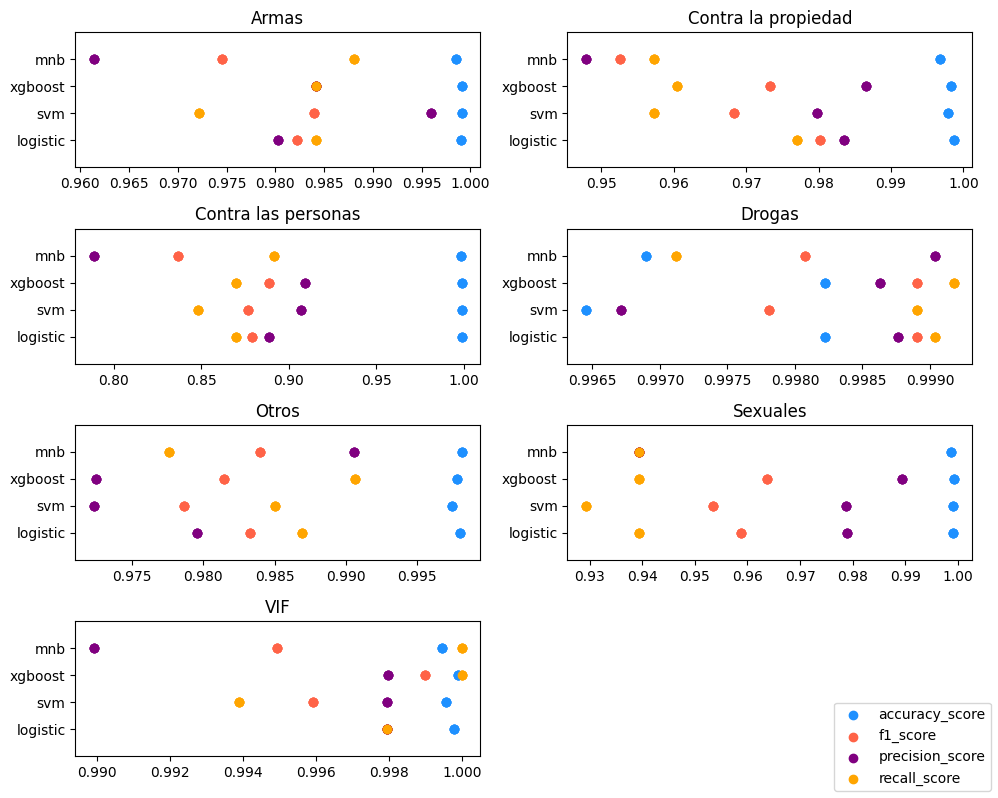

In [62]:
# se genera un diccionario con los modelos para generar un dataframe con las metricas
diccionario_modelos = {
    'logistic': logmodel_best,
    'svm': svm_best,
    'xgboost': xgboost_model,
    'mnb': nb_model_best
}
# Generamos el gráfico de comparación
faux.generar_graficos_comparacion(diccionario_modelos, X_test, y_test, label_encoder)

<font color='Blue'>Del el gráfco anterior se puede deducir lo siguiente:
- <font color='Blue'>Se observa que la mayoria de las metricas de todos los modelos en todas las categorías presentan valores superiores a 0.8, excepto el precision score de Naive Bayes en la categoria "Contra las personas" (0.78 aprox.)
- <font color='Blue'>Hay rangos de valores de métricas muy pequeños, por lo que en la práctica, en esos casos, todos los modelos tienen similar comportamiento.
- <font color='Blue'>El modelo Logistic Regresion, es el que mayormente sus métrias presentan valores más altos (están más juntas en la parte derecha del gráfico)
<font color='Blue'>Dicho lo anterior, estos valores de métricas son inhabitualmente altos y se deberá defifir si responden adecuadamente al requerimiento o establecer un mecanismo para que eso suceda.

### 6.6 Reporte del mejor modelo predictivo en base a los resultados. 

Observamos que al comparar los cuatro modelos clasificatorios se obtienen diferentes resultados, se presentan en la siguiente lista desde el mejor modelo al peor.

1. **Logistic Regression.**
2. **XGBoost.**
3. **Suport Vector Machine.**
4. **Multinomial Naive Bayes.**

En primer lugar comparamos el F1-core, debido a que es un promedio entre Precision y Recall. 

Recordemos que **F1-Score** es la media armónica de la precisión y recall;  y se utiliza como métrica en los escenarios en los que la elección de la precisión o recall puede resultar en un compromiso en términos de que el modelo proporcione un alto número de falsos positivos y falsos negativos, respectivamente.

Nuestro mejor caso (**Regresión Logística**) alcanza los siguientes resultados: de un 100% para la categoria '*Drogas*' y *'VIF'*, seguida de un 98% en las categorias *'Armas'* y *'Otros'*, finalizando con un 98%,96% y 88% para las categorías *'Contra la propiedad'*, *'Sexuales'* y *'Contra las personas'* respectivamente.

Seguida por XGBoost con un 100% para la categoria '*Drogas*' y *'VIF'*, seguida de un 98%, 98%, 97%, 96% y 89% para las categorias *'Armas'*, *'Otros'*, *'Contra la propiedad'*, *'Sexuales'* y *'Contra las personas'* respectivamente.

Suport Vector Machine con un 100% para la categoria '*Drogas*' y *'VIF'*,un 98% tanto para las categorias *'Armas'* y *'Otros'*, finalizando con 97%, 95% y 86% para las clases *'Contra la propiedad'*, *'Sexuales'* y *'Contra las personas'* respectivamente.

En ultimo lugar tenemos a Multinomial Naive Bayes con un 100% para la categoria '*Drogas*', seguida de un 99% para la categoria  *'VIF'*, un 98% tanto para las categorias *'Armas'* y *'Otros'*, finalizando con 96%, 95% y 82% para las clases *'Contra la propiedad'*, *'Sexuales'* y *'Contra las personas'* respectivamente.


De la misma manera se comparó precision y recall, en donde se obtienen resultados que aseveran el orden de mejor modelo a peor modelo predictivo.

**Precision** corresponde a la puntuación que permite medir el rendimiento del modelo a partir del recuento de verdaderos positivos de la manera correcta de todas las predicciones positivas realizadas. En el caso de nuestro mejor modelo corresponde a las siguientes metricas: 100% para las categorías *'Armas'*, *'Drogas'* y *'VIF'*, un 98% para las categorias *'Contra la propiedad'*, *'Otros'* y *'Sexuales'*, finalizando un un 91% para la categoria *'Contra las personas'*.

**Recall** o **Sensibilidad** corresponde a la puntuación que permite medir el rendimiento del modelo a partir del recuento de verdaderos positivos de forma correcta de todos los valores positivos reales. En nuestro mejor modelo observamos los siguientes resultados:  100% para las categorías *'Drogas'* y *'VIF'*, un 99% para *'Otros'* , un 98% para *'Armas'* y *'Contra la propiedad'*, finalizando con 94% y 87% para las categorias *'Sexuales'* y *'Contra las personas'* respectivamente.

**Acurracy** corresponde a la puntuación que permite medir el rendimiento del modelo a partir de la proporción de la suma de verdaderos positivos y verdaderos negativos de todas las predicciones realizadas. Po lo anterior en general se concidera una buena metrica, en nuestro caso tiene muy buenos resultados, sin embargo, no es correcta su utilización debido a que esta metrica no funciona correctamente cuando hay desbalance de clases.

______

## <font color='MediumSeaGreen'>Sección 7.- Hallazgos </font>

Luego de nuestro primer análisis del notebook, encontramos los siguientes hallazgos:

* Es necesario contar con datos de denuncias escritas directamente por los denunciantes en la GLOSA, para poder entrenar los modelos con data no procesada. Las glosas actuales están resumidas por analistas, lo que la hacen demasiado técnicas. Esto nos hace suponer que el modelo aprende con datos técnicos y no reales.

* Con un total de denuncias de 30.359, un 73% son relacionados al delito de drogas.

* Las comunas de Independencia y San Joaquín en la RM, presentan el mayor índice de denuncias por 10.000 habitantes y Paine, en tercer lugar. Mientras que Lo Barnechea y Vitacura presentan la menor cantidad de denuncias realizadas; esto puede deberse a que estas cuentan con mayor presupuesto para programas de seguridad comunal.


* Con respecto a la cantidad de denuncias registradas en una semana, se observa lo siguiente: 
    * Los fines de semana hay una tendencia en la disminución de ingresos de denuncias con respecto a los días laborales.
    * Los días Martes y Viernes existe un aumento marcado en denuncias de delitos contra las personas.
    * Con respecto a las denuncias por drogas los registros  se mantienen constantes dentro de los días laborales.
    * Los días Jueves exite un pequeño incremento porcentual en las denuncias Sexuales.
    * En el resto de las categorías de delitos, los peaks de denuncias son los días Martes.


_______________________

## <font color='MediumSeaGreen'>Sección 8.- Conclusiones provisorias</font>

Tras el análisis de los datos y de los hallazgos encontrados hasta el momento, podemos deducir que en general nuestros modelos entrenados obtienen muy buenos resultados, lo que no es de extrañar debido a que la data que utilizamos estaba previamente escrita por analistas, lo que se ve reflejado en las palabras técnicas en la columna *'GLOSA'*, por esa razon suponemos que nuestro modelos pueden estar sobre-fiteados.

Como se indica en el parrafo anterior, los proximos pasos estarán enfocados en estrategias para atacar el desbalance de clases, así como también la integración de nueva data, que incluya texto menos procesado. De esta manera se intentará procesar datos más semejantes a la realidad.

A fin de solucionar el desbalanceo de clases, se realizarán pruebas con técnicas de sobremuestreo de las clases minoritarias y submuestreo de clase dominante. Además se probará con la generación de muestras sintéticas a través de la librería SMOTE.
Otra posibilidad será agrupar en una clase todas las demas clases de delitos minoritarios, esto para tener una clase de 'Drogas' y la otra como 'Otros_delitos', siendo esta última una clase con mayores registros, y se disminuya en algo el desbalance.

En relación a la integración de nuevos datos, el equipo se encuentra en constante diálogo con funcionarios de la plataforma DENUNCIA SEGURO, a través de los cuales se realizó la solicitud de obtención de nuevos datos, lo menos procesados posible, a fin de emular la experiencia de una denuncia real.

De la misma forma, se realizan gestiones con la Policía de Investigaciones de Chile, con el objetivo de integrar denuncias de esa Institución para integrarlas al presente modelo, generando un modelo de data mixta, que eventualmente permita poder reentrenar los datos


## <font color='MediumSeaGreen'>Sección 9.- Pruebas de los modelos con data extra </font>

Tal como lo indica el punto anterior, la data que poseemos hasta el momento solo tiene data previamente procesada por analistas y abogados de Denuncia Seguro, es por ello por lo que probaremos en los siguientes códigos como está funcionando nuestros modelos con oraciones parecidas a una denuncia realizada por un civil. 

In [63]:
listado = ['hay unos locos que venden falopa en la esquina de la calle 10 con carrera 10',
            'hay unos flaites que venden droga en la esquina de martinez de rosas con errazuri',
            'mi vecina le saca la shusha a su hijo todos los dias',
            'mi vecino le pega a su señora cuando llega curado a su casa',
            'Mi papa me saca la cresta cada vez que pelea con mi mama',
            'en la calle falsa 123 vive un señor que acosa a las niñas que salen del colegio \
            que está a la vuelta',
            'en la avenida recoleta hay una casa con muchos perros sucios y mal cuidados',
            'en la esquina de mi casa vive un loco que hartas veces lo han encontrado \
            metiendose a las casas de los vecinos']
clases = [3,3,6,6,6,5,4,1]
dict_clases = dict(zip(range(0,len(list(label_encoder.classes_))),list(label_encoder.classes_)))

prediccion_xgboost = faux.predict_category(xgboost_model, count_vectorizer, label_encoder, listado)
prediccion_logistic = faux.predict_category(logmodel_best, count_vectorizer, label_encoder, listado)
prediccion_nb = faux.predict_category(nb_model_best, count_vectorizer, label_encoder, listado)
prediccion_svm = faux.predict_category(svm_best, count_vectorizer, label_encoder, listado)

df_comparacion = pd.DataFrame({'glosa':listado,
                                'clase_orig_cod':clases,
                                'clase_orig_dec':[dict_clases[x] for x in clases],
                                'xgboost':prediccion_xgboost[0],
                                'logistic':prediccion_logistic[0],
                                'nb':prediccion_nb[0],
                                'svm':prediccion_svm[0]})

df_comparacion['xgboost']  = (df_comparacion['xgboost']  - df_comparacion['clase_orig_cod']) == 0
df_comparacion['logistic'] = (df_comparacion['logistic'] - df_comparacion['clase_orig_cod']) == 0
df_comparacion['nb']       = (df_comparacion['nb']       - df_comparacion['clase_orig_cod']) == 0
df_comparacion['svm']      = (df_comparacion['svm']      - df_comparacion['clase_orig_cod']) == 0

df_comparacion[['clase_orig_dec','xgboost','logistic','nb','svm']].style.applymap(lambda x: "background-color: green" if x==True else "background-color: white")

,clase_orig_dec,xgboost,logistic,nb,svm
0,Drogas,False,False,False,False
1,Drogas,True,True,True,False
2,VIF,False,False,True,False
3,VIF,False,False,False,False
4,VIF,False,False,False,False
5,Sexuales,False,False,False,False
6,Otros,True,True,True,True
7,Contra la propiedad,False,False,False,False


<font color='Blue'> Al realizar la prueba con un listado de palabras parecidas a lo que un usuario podria denunciar nos percatamos que no está clasificando bien nuestro modelo, como se observa en la tabla una frase relacionada a drogas solo fue reconocida por XGBoost, Regresión logística y NB, una frase de VIF solo pudo ser reconocida por NB, mientras que de tres frases relacionada a la clasificación ‘Otros’ solo 1 fue reconocida por todos los modelos. 
Es por ello que retomaremos la data previamente procesada, dejaremos solo las columnas relevantes para continuar el entrenamiento y le adicionaremos denuncias entregadas por Policía de Investigaciones, previamente categorizadas y posteriormente adicionaremos palabras clave para cada una de las categorías.</font>

______

## <font color='MediumSeaGreen'>Sección 10.- Retomar data </font>

Como se explica en la sección anterior, en esta sección retomaremos la data anterior con el fin de realizar una limpieza extra a la data, dejando solo la columna ‘GLOSA_PROCESADA’ y ‘CATEGORIZACIÓN_SIMPLIFICADA’ , este paso decidimos realizarlo ya que la data entregada por Policía de Investigaciones solo cuenta con dichas columnas y requerimos que ambas datas contengan los mismos nombres de columnas para posteriormente unirlas y aumentar los datos de entrenamiento.

In [64]:
#Revisamel data frame que utilizamos 
df_denuncias_procesadas.sample(5)

,GLOSA_PROCESADA,FECHA_LLAMADA,ESTADO,COD_COM,COMUNA,CATEGORIZACIÓN_SIMPLIFICADA,ANIO_MES,DIA_SEMANA
7624,microtrafico marihuana procesada,2021-07-07,Denuncia jurídica,13129.0,Castro,3,2021-07,Miércoles
21756,microtrafico cocaina base marihuana procesada ...,2022-04-27,Denuncia jurídica,5804.0,Villa Alemana,3,2022-04,Miércoles
23384,microtrafico drogas pedegua,2022-06-01,Denuncia Jurídica,5404.0,Petorca,3,2022-06,Miércoles
18398,microtrafico marihuana procesada familiar,2022-02-21,Denuncia jurídica,13201.0,Puente Alto,3,2022-02,Lunes
21629,microtrafico clorhidrato cocaina cocaina base ...,2022-04-24,Denuncia jurídica,5601.0,San Antonio,3,2022-04,Domingo


### 10.1 Eliminamos las variable que no utilizaremos 

Eliminaremos las variables que no utilizaremos y no le dan peso a nuestra data, para este caso son las siguientes columnas: *'FECHA_LLAMADA', 'ESTADO', 'COD_COM', 'COMUNA', 'ANIO_MES' y 'DIA_SEMANA'*.

In [65]:
#Eliminamos las columnas que no utilizaremos
df_denuncias_procesadas_final = df_denuncias_procesadas.drop(['FECHA_LLAMADA', 'ESTADO', 'COD_COM', 'COMUNA', 'ANIO_MES', 'DIA_SEMANA'], axis=1)

In [66]:
#Revisamos los cambios realizados
df_denuncias_procesadas_final.sample(5)

,GLOSA_PROCESADA,CATEGORIZACIÓN_SIMPLIFICADA
15537,microtrafico marihuana procesada clorhidrato c...,3
570,maltrato animal yeya,4
19203,cultivo microtrafico marihuana vaytiare,3
6666,microtrafico cocaina base marihuana procesada ...,3
25945,microtrafico clorhidrato cocaina,3


<font color='Blue'> Se realizaron correctamente los cambios </font>


### 10.2 Disminución de clase mayoritaria

Decidimos disminuir la clase mayoritaria, en este caso hablamos de la clase *“Drogas”*, con el fin de que no afecte al sobreajuste cuando realicemos los entrenamiento.
La clase mayoritaria será disminuida un 72% , ya que nos percatamos que la glosa procesada por analistas de Denuncia Seguro utiliza lenguaje muy técnico y esto nos puede perjudicar en las decisiones siguientes. 


In [67]:
##Disminucion de la clase mayoritaria
cantidad_clase_mayoritaria = 5000
df_clases_minoritarias = df_denuncias_procesadas_final[df_denuncias_procesadas_final["CATEGORIZACIÓN_SIMPLIFICADA"] != 3]
df_clase_mayoritaria = df_denuncias_procesadas_final[df_denuncias_procesadas_final["CATEGORIZACIÓN_SIMPLIFICADA"] == 3]
df_clase_mayoritaria = df_clase_mayoritaria.sample(n=cantidad_clase_mayoritaria, random_state=RANDOM_SEED)
df_denuncias_procesadas_final = pd.concat([df_clases_minoritarias,df_clase_mayoritaria], ignore_index=True)
df_denuncias_procesadas_final["CATEGORIZACIÓN_SIMPLIFICADA"].value_counts()

3    5000
4    1503
6    1419
1     968
0     764
5     270
2     128
Name: CATEGORIZACIÓN_SIMPLIFICADA, dtype: int64

<font color='Blue'>Se observan que los cambios se realizado correctamente</font>

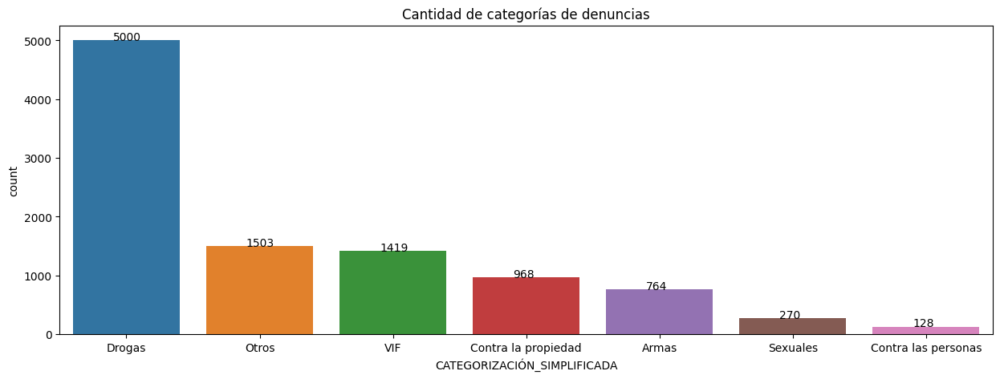

In [68]:
# Graficamos la cantidad de datos en cada categoría del vector objetivo, ordenados por cantidad.
faux.generar_countplot(df_denuncias_procesadas_final, 'CATEGORIZACIÓN_SIMPLIFICADA', label_encoder=label_encoder, procesar=PROCESAR_TODO)

<font color='Blue'>Se observan que los cambios se realizado correctamente</font>

<font color='Blue'>El grafico muestra de forma simplificada la totalidad de datos que tiene actualmente nuestra data. Este grafico se encuentra ordenado de la categoría con mayor número de denuncias a la que posee menos, quedando de la siguiente manera: </font>
- <font color='Blue'>**Drogas** con 5.000 denuncias</font>
- <font color='Blue'>**Otros** con 1.503 denuncias</font>
- <font color='Blue'>**VIF** con 1.419 denuncias</font>
- <font color='Blue'>**Contra la propiedad** con 968 denuncias</font>
- <font color='Blue'>**Armas** con 764 denuncias </font>
- <font color='Blue'>**Sexuales** con 270 denuncias</font>
- <font color='Blue'>**Contra las personas** con 128 denuncias</font>


_______

## <font color='MediumSeaGreen'>Sección 11.- Ingreso de data adicional </font>

Importaremos data adicional escritas por usuarios, las cuales fueron conseguidas gracias a una gran investigación que realizamos como equipo uniendo data facilitada por Policía de Investigaciones, denuncias extraídas de la plataforma gratuita SOSAFE y además en base a lo anterior complementamos con denuncias falsas que utilizan oraciones con bajo nivel de redacción para asimilar denuncias realizadas por usuarios con menor léxico. Este procedimiento se decidió realizar para entrenar nuestro modelo con data lo más similar a escrita por civiles.

In [69]:
#Importar base de datos adicional
df_denuncias_adicionales = pd.read_excel('Data_adicional/Conjunto_data_adicional_total.xlsx', engine= 'openpyxl')

In [70]:
#Revisamos los datos importados en df_denuncias_adicionales
df_denuncias_adicionales.head()

,Glosa,Clasificacion_delito,Clasificacion
0,en de la luna 352 hay una armeria que el otro ...,Armas,0.0
1,en sifon 81 en la feria que se pone los dias m...,Armas,0.0
2,en eduardo osorio pardo 332 todos los dias se ...,Armas,0.0
3,en ingeniero carlos vial 489 el dueño de casa ...,Armas,0.0
4,en las camelias oriente esperando que el semaf...,Armas,0.0


### 11.1 Comparación de dataframes 

Luego de ingresar la data nueva con vocabulario de uso cotidiano por la mayoría de los chilenos, uniremos ambos Data Frames para volver a entrenar los dos mejores modelos.

Previo a unir ambos Data Frames compararemos las columnas y las igualaremos para evitar problemas posteriores


In [71]:
#Comparamos las columnas de ambos DataFrame
faux.compara_columns_df(df_denuncias_procesadas_final,df_denuncias_adicionales)

Campos que difieren entre DataFrame 1 y DataFrame 2: 
 {'GLOSA_PROCESADA', 'CATEGORIZACIÓN_SIMPLIFICADA'}

Campos que difieren entre DataFrame 2 y DataFrame 1: 
 {'Glosa', 'Clasificacion', 'Clasificacion_delito'}


<font color='Blue'>Como podemos observar existen diferencia en el número de columnas y sus nombres. </font>
<font color='Blue'>Para el caso del df_denuncias_procesadas_final vs df_denuncias_adicionales</font>
<font color='Blue'>La diferencia de los nombres de columnas son: </font>
- <font color='Blue'>'CATEGORIZACIÓN_SIMPLIFICADA' y 'GLOSA_PROCESADA'</font>
<font color='Blue'>Mientras que df_denuncias_adicionales vs df_denuncias_procesadas_final</font>
<font color='Blue'>La diferencia de columnas son : </font>
- <font color='Blue'>'Glosa', 'Clasificacion' y 'Clasificacion_delito'. </font>

<font color='Blue'>Al realizar una revisión visual de *’GLOSA_PROCESADA’* del dataframe df_denuncias_procesadas_final y la columna *’Glosa’* del dataframe df_denuncias_adicionales contienen la misma información: **Denuncias**. Es por ello que decidimos igualar el nombre de ambas columnas, denominándola **’GLOSA_PROCESADA’**.</font>


<font color='Blue'>El mismo caso ocurre con en el nombre de la columna *’Clasificacion’* del dataframe df_denuncias_adicionales vs el nombre *'CATEGORIZACIÓN_SIMPLIFICADA'*. Igualando el nombre a *'CATEGORIZACIÓN_SIMPLIFICADA'*.</font>


In [72]:
#Igualamos los nombres de las columnas
df_denuncias_adicionales = df_denuncias_adicionales.rename(columns={'Clasificacion': 'CATEGORIZACIÓN_SIMPLIFICADA', 'Glosa': 'GLOSA_PROCESADA'})

In [73]:
#Eliminamos la colunmna 'Clasificacion_delito' ya que no se encuentra en el otro dataframe
df_denuncias_adicionales = df_denuncias_adicionales.drop(columns='Clasificacion_delito')

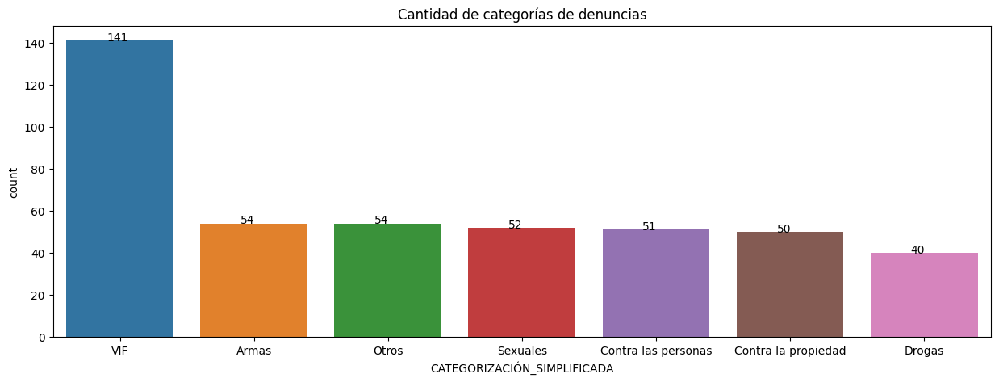

In [74]:
# Graficamos la cantidad de datos en cada categoría del vector objetivo, ordenados por cantidad.
faux.generar_countplot(df_denuncias_adicionales, 'CATEGORIZACIÓN_SIMPLIFICADA', label_encoder=label_encoder, procesar=PROCESAR_TODO)

<font color='Blue'>El grafico muestra de forma simplificada la totalidad de datos que tiene actualmente nuestra data. Este grafico se encuentra ordenado de la categoría con mayor número de denuncias a la que posee menos, quedando de la siguiente manera: </font>
- <font color='Blue'>**VIF** con 141 denuncias</font>
- <font color='Blue'>**Armas** con 54 denuncias </font>
- <font color='Blue'>**Otros** con 54 denuncias</font>
- <font color='Blue'>**Sexuales** con 52 denuncias</font>
- <font color='Blue'>**Contra las personas** con 51 denuncias</font>
- <font color='Blue'>**Contra la propiedad** con 50 denuncias</font>
- <font color='Blue'>**Drogas** con 40 denuncias</font>


In [75]:
#Comparamos las columnas de ambos DataFrame
faux.compara_columns_df(df_denuncias_procesadas_final,df_denuncias_adicionales)

Campos que difieren entre DataFrame 1 y DataFrame 2: 
 set()

Campos que difieren entre DataFrame 2 y DataFrame 1: 
 set()


<font color='Blue'> Ya no se observan diferencias entre df_denuncias_procesada_final y df_denuncias_adicionales</font>

In [76]:
#Contamos las filas y las columnas de ambos DataFrame
faux.contador_filas_columns(df_denuncias_procesadas_final,df_denuncias_adicionales)

La cantidad de registros en Data Frame 1:
 filas, columnas: (10052, 2)
La cantidad de registros en Data Frame 2:
 filas, columnas: (442, 2)


<font color='Blue'> Se observa que el dataframe df_denuncias_procesadas_final posee 10.052 filas con denuncias y 2 columnas. Mientras que el dataframe df_denuncias_adicionales tiene 442 filas con denuncias y 2 columnas. </font>


<font color='Blue'> Esta información nos reafirma el echo que podemos concatenar ambas datas en los siguientes pasos. </font>


### 11.2 Extracción de la data de validación de data nueva

Previo a la concatenación de ambos dataframe extraeremos el 10% de la data para guardarlo en un dataframe aparte denominando **df_validacion_2**, con el fin que esta data solo sea utilizada para validar y evaluar el proceso realizado en el presente proyecto.

In [77]:
#División de data, guardando el 10% en otro archivo para validación
df_denuncias_adicionales, df_validacion_2 = train_test_split(df_denuncias_adicionales, test_size = 0.1, random_state = RANDOM_SEED)

In [78]:
# Exportacion de datos de validación a CSV
df_validacion_2.to_csv('df_validacion_2.csv', index=False, sep=';', encoding='utf-8')

### 11.3 Union de ambos Data Frmaes

Luego de la extracción de la nueva data de validación procedemos a concatenar ambos dataframe.

In [79]:
# Uniremos ambos dataframe
df_denuncias_concatenadas = pd.concat([df_denuncias_procesadas_final,df_denuncias_adicionales], ignore_index=True)
df_denuncias_concatenadas.sample(n=3)

,GLOSA_PROCESADA,CATEGORIZACIÓN_SIMPLIFICADA
820,violencia intrafamiliar flagrante mutua residen,6.0
2379,receptacion vcitor,1.0
568,robo violencia residente,1.0


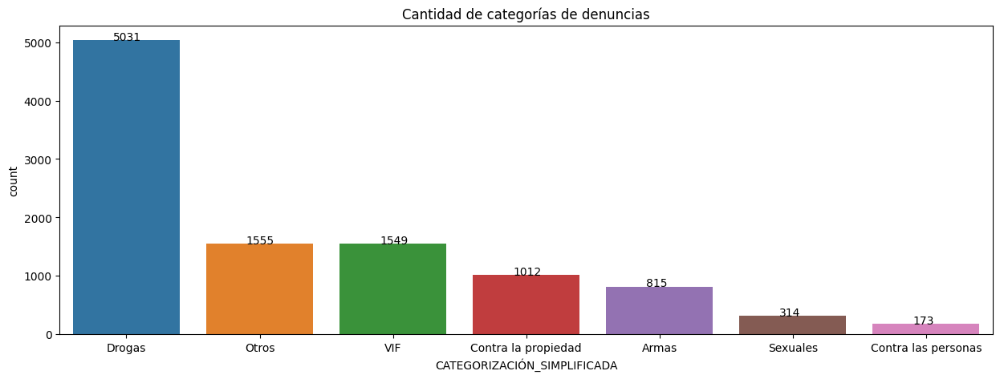

In [80]:
# Graficamos la cantidad de datos en cada categoría del vector objetivo, ordenados por cantidad.
faux.generar_countplot(df_denuncias_concatenadas, 'CATEGORIZACIÓN_SIMPLIFICADA', label_encoder=label_encoder, procesar=PROCESAR_TODO)

<font color='Blue'>El grafico muestra de forma simplificada la totalidad de datos que tiene actualmente nuestra data. Este grafico se encuentra ordenado de la categoría con mayor número de denuncias a la que posee menos, quedando de la siguiente manera: </font>

- <font color='Blue'>**Drogas** con 5.031 denuncias, **aumentando un 0.61%** con respecto a la data entregada por Denuncia Seguro. </font>
- <font color='Blue'>**Otros** con 1.555 denuncias, **aumentando un 3.3%** con respecto a la data entregada por Denuncia Seguro. </font>
- <font color='Blue'>**VIF** con 1.549 denuncias, **aumentando un 8.9%** con respecto a la data entregada por Denuncia Seguro.  
- <font color='Blue'>**Contra la propiedad** con 1012 denuncias, **aumentando un 4.3%** con respecto a la data entregada por Denuncia Seguro. </font>
- <font color='Blue'>**Armas** con 815 denuncias, **aumentando un 6.25%** con respecto a la data entregada por Denuncia Seguro. </font>
- <font color='Blue'>**Sexuales** con 314 denuncias, **aumentando un 14%** con respecto a la data entregada por Denuncia Seguro. </font>
- <font color='Blue'>**Contra las personas** con 173 denuncias, **aumentando un 26%** con respecto a la data entregada por Denuncia Seguro. </font>

Obtendremos la frecuencias de palabra por categoría 

In [81]:
# - frecuencia maxima de palabra por categoria
frec_max_categoria = [0,0,0,0,0,0,0]
for key,value in diccionario_palabras_categorias.items():
    indice = list(label_encoder.classes_).index(key)
    valor = list(value.values())[0]
    frec_max_categoria[indice] = valor
frec_max_categoria[3] = cantidad_clase_mayoritaria
frec_max_categoria

[699, 336, 64, 5000, 1143, 105, 1418]

In [82]:
#Observamos el diccionario de clases
dict_clases

{0: 'Armas',
 1: 'Contra la propiedad',
 2: 'Contra las personas',
 3: 'Drogas',
 4: 'Otros',
 5: 'Sexuales',
 6: 'VIF'}

<font color='Blue'>De acuerdo con los resultados de la frecuencia de palabras repetidas por categorías podemos concluir lo siguiente: </font>
-	<font color='Blue'>Categoría **’Armas’**, alias *’0’*, la frecuencia de la palabra que más se repita es de 699 veces. </font>
-	<font color='Blue'>Categoría **'Contra la propiedad'**, alias *’1’*, la frecuencia de la palabra que más se repita es de 336 veces. </font>
-	<font color='Blue'>Categoría **'Contra las personas'**, alias *’2’*, la frecuencia de la palabra que más se repita es de 64 veces. </font>
-	<font color='Blue'>Categoría **'Drogas'**, alias *’3’*, la frecuencia de la palabra que más se repita es de 5000 veces. </font>
-	<font color='Blue'>Categoría **'Otros'**, alias *’4’*, la frecuencia de la palabra que más se repita es de 1143 veces. </font>
-	<font color='Blue'>Categoría **'Sexuales'**, alias *’5’*, la frecuencia de la palabra que más se repita es de 105 veces. </font>
-	<font color='Blue'>Categoría **'VIF'**, alias *’6’*, la frecuencia de la palabra que más se repita es de 1418 veces. </font>


## <font color='MediumSeaGreen'>Sección 12.- Ingreso de palabras claves </font>

En modo de enriquecer la data con palabras claves para tener una mejor clasificación de denuncias, como empresa PredictLab realizamos una exhaustiva investigación y creamos un archivo con palabras claves para cada categoría, un ejemplo de ello es la utilización de sobrenombres de drogas que utilizan actualmente los jóvenes de nuestro país. 

In [83]:
# - leer listado de palabras
df_palabras_clave = pd.read_excel('Palabras_clave/Palabras_claves_proyecto.xlsx', engine= 'openpyxl')
df_palabras_clave.sample(n=3)

,GLOSA_PROCESADA,CATEGORIZACIÓN_SIMPLIFICADA
274,muerte,2.0
40,blond,3.0
365,setas,3.0


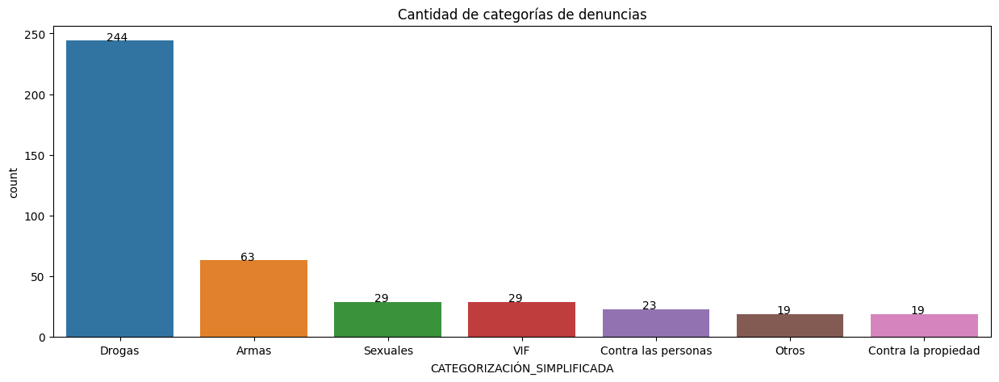

In [84]:
# Graficamos la cantidad de datos en cada categoría del vector objetivo, ordenados por cantidad.
faux.generar_countplot(df_palabras_clave, 'CATEGORIZACIÓN_SIMPLIFICADA', label_encoder=label_encoder, procesar=PROCESAR_TODO)

<font color='Blue'>El grafico muestra de forma simplificada la totalidad de datos que tiene actualmente nuestra data. Este grafico se encuentra ordenado de la categoría con mayor número de denuncias a la que posee menos, quedando de la siguiente manera: </font>

- <font color='Blue'>**Drogas** con 244 palabras claves nuevas. </font>
- <font color='Blue'>**Armas** con 63 palabras claves nuevas. </font>
- <font color='Blue'>**Sexuales** con 29 palabras claves nuevas. </font>
- <font color='Blue'>**VIF** con 29 palabras claves nuevas. </font>
- <font color='Blue'>**Contra las personas** con 23 palabras claves nuevas.  </font>
- <font color='Blue'>**Otros**  19 palabras claves nuevas.  </font>
- <font color='Blue'>**Contra la propiedad** con 19 palabras claves nuevas.  </font>


### 12.1 Aumentar la frecuencia de palabras claves

Aumentaremos artificialmente la frecuencia de las palabras claves con el fin de dar mayor peso a dichas palabras y lograr así mejorar el modelo para que reconozca data entregada por usuarios comunes.

In [85]:
# GLOSAS POR PALABRAS SEPARADAS HACIA ABAJO
listado_nuevas_glosas = []
listado_nuevas_categorias = []
for clase in range(7):
    cantidad = int(frec_max_categoria[clase]/2) if frec_max_categoria[clase]%2==0 else int((frec_max_categoria[clase]-1)/2)
    palabras = list(df_palabras_clave[df_palabras_clave["CATEGORIZACIÓN_SIMPLIFICADA"] == clase]["GLOSA_PROCESADA"].values)
    listado_nuevas_glosas += palabras*cantidad
    listado_nuevas_categorias += [clase]*cantidad*len(palabras)
df_nuevas_glosas = pd.DataFrame({"GLOSA_PROCESADA":listado_nuevas_glosas, "CATEGORIZACIÓN_SIMPLIFICADA":listado_nuevas_categorias })
print(df_nuevas_glosas.shape)
print(df_nuevas_glosas["CATEGORIZACIÓN_SIMPLIFICADA"].value_counts())


(668833, 2)
3    610000
0     21987
6     20561
4     10849
1      3192
5      1508
2       736
Name: CATEGORIZACIÓN_SIMPLIFICADA, dtype: int64


<font color='Blue'>Observamos que aumentaron la frecuencia de palabras claves de la siguiente manera: </font>
- <font color='Blue'>**Drogas**, alias ***’3’***, con 610.000 palabras claves. </font>
- <font color='Blue'>**Armas**, alias ***’0’***, con 21.987 palabras claves. </font>
- <font color='Blue'>**VIF**, alias ***’6’***, con 20.561 palabras claves. </font>
- <font color='Blue'>**Otros**, alias ***’4’***, con 10.849 palabras claves. </font>
- <font color='Blue'>**Contra la propiedad**, alias ***’1’***, con 610.000 palabras claves. </font>
- <font color='Blue'>**Sexuales**, alias ***’5’***, con 1.508 palabras claves. </font>
- <font color='Blue'>**Contra las personas**, alias ***’2’***, con 736 palabras claves. </font>


In [86]:
#Mostramos los cambios realizados 
df_nuevas_glosas.sample(n=3)

,GLOSA_PROCESADA,CATEGORIZACIÓN_SIMPLIFICADA
640624,profugo,4
116090,mefedrona,3
574046,ketamina,3


### 12.2  Concatenar los data frames

Una vez realizados los cambios concatenaremos dataframe que trabajamos previamente, en este caso: *‘df_denuncias_concatenadas’* con el dataframe de palabras claves denominado *‘df_nuevas_glosas’* y creamos un solo dataframe, el llamaremos ***’ df_denuncias_mas_palabras’***.

In [87]:
# - concatenar
df_denuncias_mas_palabras = pd.concat([df_denuncias_concatenadas,df_nuevas_glosas], ignore_index=True)
# print(df_denuncias_mas_palabras.columns)
df_denuncias_mas_palabras.columns = ["GLOSA","CATEGORIZACIÓN_SIMPLIFICADA"]
# print(df_denuncias_mas_palabras.columns)


In [88]:
#Revisamos os cambios realizados
df_denuncias_mas_palabras.head()

,GLOSA,CATEGORIZACIÓN_SIMPLIFICADA
0,tenencia ilegal fuego municiones habitacion,0.0
1,violencia intrafamiliar flagrante conviviente ...,6.0
2,violencia intrafamiliar flagrante hermana resi...,6.0
3,maltrato animal residentes vivienda,4.0
4,violencia intrafamiliar flagrante ex conviviente,6.0


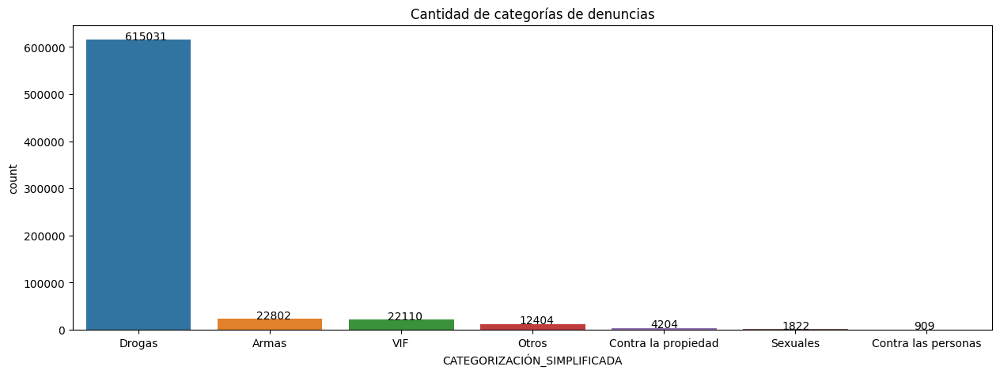

In [89]:
# Graficamos la cantidad de datos en cada categoría del vector objetivo, ordenados por cantidad.
faux.generar_countplot(df_denuncias_mas_palabras, 'CATEGORIZACIÓN_SIMPLIFICADA', label_encoder=label_encoder, procesar=PROCESAR_TODO)


<font color='Blue'>El grafico muestra de forma simplificada la totalidad de datos que tiene actualmente nuestra data. Este grafico se encuentra ordenado de la categoría con mayor número de denuncias a la que posee menos, quedando de la siguiente manera: </font>

- <font color='Blue'>**Drogas** con 615.031 denuncias, **aumentando 122 veces** con respecto a la data concatenada de Denuncia Seguro y data adicional. </font>
- <font color='Blue'>**Armas** con 22.802 denuncias, **aumentando 27 veces** con respecto a la data concatenada de Denuncia Seguro y data adicional. </font>
- <font color='Blue'>**VIF** con 22.110 denuncias, **aumentando 14 veces** con respecto a la data concatenada de Denuncia Seguro y data adicional. </font>
- <font color='Blue'>**Otros** con 12.404 denuncias, **aumentando 8 veces** con respecto a la data concatenada de Denuncia Seguro y data adicional. </font>
- <font color='Blue'>**Contra la propiedad** con 4.204 denuncias, **aumentando 4.15 veces** con respecto a la data concatenada de Denuncia Seguro y data adicional. </font>
- <font color='Blue'>**Sexuales** con 1.822 denuncias, **aumentando 5.8 veces** con respecto a la data concatenada de Denuncia Seguro y data adicional.  </font>
- <font color='Blue'>**Contra las personas** con 909 denuncias, **aumentando 2.89 veces** con respecto a la data concatenada de Denuncia Seguro y data adicional. </font>


### 12.3 extracción de data frame con data procesada

In [90]:
#Se aplica la función text_processor a la columna Glosa y se genera un nueva columna con el resultado
dataframe_denuncias_2_path = 'serializados/dataframe_denuncias_2.pkl'
if os.path.exists(dataframe_denuncias_2_path):
    df_denuncias_mas_palabras = pkl.load(open(dataframe_denuncias_2_path, 'rb'))
else:
    df_denuncias_mas_palabras['GLOSA_PROCESADA']=df_denuncias_mas_palabras['GLOSA'].apply(faux.text_preprocessor,stopwords=swe)
    df_denuncias_mas_palabras = df_denuncias_mas_palabras.drop(columns=["GLOSA"])
    pkl.dump(df_denuncias_mas_palabras, open(dataframe_denuncias_2_path, 'wb'))

### 12.4 Vectorización de glosa procesada.

In [91]:
# # Vectorización de GLOSA_PROCESADA
count_vectorizer_2 = CountVectorizer(preprocessor=None)
matrix_dispersa_2 = count_vectorizer_2.fit_transform(df_denuncias_mas_palabras['GLOSA_PROCESADA'])

### 12.5 Separación de muestra de entrenamiento y validación

In [92]:
# Separación de muestras entre muestra de entrenamiento y validación
X_2 = matrix_dispersa_2 #df_denuncias_procesadas['GLOSA_PROCESADA']
y_2 = df_denuncias_mas_palabras['CATEGORIZACIÓN_SIMPLIFICADA']
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2, test_size = 0.33, random_state = RANDOM_SEED)

## <font color='MediumSeaGreen'>Sección 13.- Modelación 2 </font>


Tal como ocurrió en la sección 6 con la modelación del vector objetivo, en este punto (sección 13) volveremos a realizar entrenamiento de nuestro vector objetivo, pero una data mucho más enriquecida que en el entrenamiento anterior. 

Para esta sección se decidió elegir los dos mejores modelos que se obtuvieron anteriormente y con ellos volver a entrenar nuestra nueva data, decir, se eligió en primer lugar la **Regresión Logística** y en segundo lugar **XGBoost**.

### 13.1 Regresion Logistica



Tal como se indica en el **punto 6.1** la **Regresión logística** es un tipo de análisis de regresión utilizado para predecir el resultado de una variable categórica (una variable que puede adoptar un número limitado de categorías) en función de las variables independientes o predictoras. 

Para este caso decidimos utilizar los siguientes hiperparametros:
- **solver**: algoritmo utilizado para la optimización del modelo. Se utiliza SAGA por permitir multiclases y estar optimizado para grandes conjustos de datos.
- **multi_class**: opciones de mecanismos de calculos
    - ovr (one vs rest): uno contra todos, se realiza el ajuste como problemas binomiales para cada categoria
    - multinomial: se ajusta mediante perdida multinomial
- **penalty**: opciones regularización para evitar sobreajuste de variables
- **c_values**: listado de coeficientes de regularización. Mienstras más pequeño, más fuerte la regularización
- **class_weiht**: opción para equilibrar las clases desbalanceadas ponderando inversamente por su frecuencia.


<center><img src="Imagenes/Regresion_logistica_2.png"  /></center>

<font color='Blue'>Los mejores parametros para Regresion Logistica son:
* <font color='Blue'>*Mejor: 0.988192 usando {'C': 100, 'class_weight': 'balanced', 'multi_class': 'ovr', 'penalty': 'l1', 'solver': 'saga'}*
* <font color='Blue'>Procesado en Procesado en 9483.616s

In [93]:
# se genera y entrena el mejor modelo en base a los parametros encontrados
# el proceso se realiza solo si el modelo no se encuentra ya serializado. Esto para ahorrar tiempo al reprocesar
regresionlogistica_model_path_2 = 'serializados/regresionlogistica_model_2.pkl'
if os.path.exists(regresionlogistica_model_path_2):
    logmodel_best_2 = pkl.load(open(regresionlogistica_model_path_2, 'rb'))
else:
    logmodel_best_2 = LogisticRegression(random_state=RANDOM_SEED, solver='saga', multi_class='ovr', C=100, penalty='l1', class_weight='balanced').fit(X_train_2, y_train_2)
    pkl.dump(logmodel_best_2, open(regresionlogistica_model_path_2, 'wb'))

In [94]:
#se genera la predicción de las clases y de la probabilidad
y_hat_log_2 = logmodel_best_2.predict(X_test_2)

In [95]:
#métricas de precisión, recall y f1-score para ambas clases
print(classification_report(y_test_2, y_hat_log_2, target_names=target_names))

                     precision    recall  f1-score   support

              Armas       1.00      0.95      0.98      7555
Contra la propiedad       0.87      0.98      0.92      1426
Contra las personas       0.20      0.75      0.32       278
             Drogas       0.99      1.00      1.00    202932
              Otros       1.00      0.95      0.97      4158
           Sexuales       0.99      0.91      0.95       585
                VIF       0.99      0.90      0.95      7230

           accuracy                           0.99    224164
          macro avg       0.86      0.92      0.87    224164
       weighted avg       0.99      0.99      0.99    224164



#### <font color='Blue'>Para Regresión Logistica se observan las siguientes métricas:

<font color='Blue'>**El modelo tiene un accuracy de**:

- <font color='Blue'>99%.

<font color='Blue'>**El modelo tiene una precisión de:**
- <font color='Blue'>100% para la categoría "Armas,
- <font color='Blue'>87% para la categoría "Contra la propiedad", 
- <font color='Blue'>20% para la categoría "Contra las personas"
- <font color='Blue'>99% para la categoría "Drogas"
- <font color='Blue'>100% para la categoría "Otros"
- <font color='Blue'>99% para la categoría "Sexuales"
- <font color='Blue'>99% para la categoría "VIF"

<font color='Blue'>**El modelo tiene una sensibilidad(recall) de:**

- <font color='Blue'>95% para la clase categoría "Armas"
- <font color='Blue'>98% para la clase la categoría "Contra la propiedad"
- <font color='Blue'>75% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>95% para la categoría "Otros"
- <font color='Blue'>91% para la categoría "Sexuales"
- <font color='Blue'>90% para la categoría "VIF"

<font color='Blue'>**El modelo tiene un f1-score(media armonica entre pres. y sensibilidad) de:**

- <font color='Blue'>98% para la clase categoría "Armas"
- <font color='Blue'>92% para la clase la categoría "Contra la propiedad"
- <font color='Blue'>32% para la categoría "Contra las personas"
- <font color='Blue'>100% para la categoría "Drogas"
- <font color='Blue'>97% para la categoría "Otros"
- <font color='Blue'>95% para la categoría "Sexuales"
- <font color='Blue'>95% para la categoría "VIF"




<font color='Blue'> Como era de esperar se observa en algunas categorías una disminución significativa en sus métricas </font>

### 13.2 XGBoost


Tal como se indica en el **punto 6.4** el **Extreme Gradient Boosting ** o **XGBoost** es método de aprendizaje automático supervisado para clasificación y regresión. Este método se basa en árboles de decisión y supone una mejora sobre otros métodos, como el bosque aleatorio y refuerzo de gradientes. Funciona bien con datasets grandes y complejos al utilizar varios métodos de optimización.

Para este caso decidimos utilizar los siguientes hiperparametros:
- '**max_depth**'= Corresponde a la profundidad máxima de un árbol. Al aumentar este valor hará que el modelo sea más complejo y más propenso a sobreajuste. Es por ello que utilizamos el siguiente rango: ***range (1, 5, 1)***.

- '**n_estimators**'= Corresponde a el número de árboles (o rondas) en un modelo. Para este caso utilizamos el siguiente rango: ***range(1, 10, 1)***.

- '**learning_rate**'= Corresponde a la reducción del tamaño del paso utilizado en la actualización para evitar el sobreajuste. Después de cada paso de refuerzo, podemos obtener directamente los pesos de las nuevas características, y *learning_rate* reduce los pesos de las características para que el proceso de refuerzo sea más conservador. Para este caso utilizamos 2 series de valores a evaluar: ***[0.2, 0.3]***.

- '**subsample**'= Corresponde a la proporción de submuestreo de las instancias de entrenamiento. En este caso establecimos ***[0.5]***, ya que muestreará aleatoriamente la mitad de los datos de entrenamiento antes de hacer crecer los árboles, lo que evitará el sobreajuste.

- **'multi:softmax'**: establece XGBoost para realizar una clasificación multiclase utilizando el objetivo softmax, también es necesario establecer num_class(número de clases)


<center><img src="Imagenes/XGBoost_3.png"  /></center>

<font color='Blue'>Los mejores parametros para XGBoost son:
* <font color='Blue'>*Mejor: usando {'learning_rate': 0.2, 'max_depth': 1, 'n_estimators': 1, 'subsample': 0.5}*
* <font color='Blue'>Procesado en 714.333s

In [96]:
# se genera y entrena el mejor modelo en base a los parametros encontrados
# el proceso se realiza solo si el modelo no se encuentra ya serializado. Esto para ahorrar tiempo al reprocesar
xgboost_model_path_2 = 'serializados/xgboost_model_2.pkl'
if os.path.exists(xgboost_model_path_2):
    xgboost_model_2 = pkl.load(open(xgboost_model_path_2, 'rb'))
else:
    xgboost_model_2 = XGBClassifier(learning_rate=0.2, max_depth=1, n_estimators=1, subsample=0.5, seed=RANDOM_SEED).fit(X_train_2, y_train_2)
    pkl.dump(xgboost_model_2, open(xgboost_model_path_2, 'wb'))

In [97]:
#Se genera la predicción de las clases y de la probabilidad
y_hat_xgb_2 = xgboost_model_2.predict(X_test_2)

#métricas de precisión, recall y f1-score para las clases
print(classification_report(y_test_2, y_hat_xgb_2, target_names=target_names))

                     precision    recall  f1-score   support

              Armas       0.99      0.06      0.10      7555
Contra la propiedad       0.99      0.07      0.13      1426
Contra las personas       1.00      0.09      0.16       278
             Drogas       0.91      1.00      0.95    202932
              Otros       1.00      0.18      0.31      4158
           Sexuales       1.00      0.09      0.17       585
                VIF       0.96      0.10      0.17      7230

           accuracy                           0.91    224164
          macro avg       0.98      0.23      0.28    224164
       weighted avg       0.92      0.91      0.88    224164



#### <font color='Blue'>Para XGBoost se observan las siguientes métricas:
<font color='Blue'>**El modelo tiene un accuracy de**:</font>

- <font color='Blue'>91%</font>
<font color='Blue'>**El modelo tiene una precisión de:** </font>
- <font color='Blue'>99% para la clase categoría "Armas"</font>
- <font color='Blue'>99% para la categoría "Contra la propiedad"</font>
- <font color='Blue'>100% para la categoría "Contra las personas"</font>
- <font color='Blue'>91% para la categoría "Drogas"</font>
- <font color='Blue'>100% para la categoría "Otros"</font>
- <font color='Blue'>100% para la categoría "Sexuales"</font>
- <font color='Blue'>96% para la categoría "VIF"</font>

<font color='Blue'>**El modelo tiene una sensibilidad(recall) de:** </font>

- <font color='Blue'>6% para la clase categoría "Armas"</font>
- <font color='Blue'>7% para la clase la categoría "Contra la propiedad"</font>
- <font color='Blue'>9% para la categoría "Contra las personas"</font>
- <font color='Blue'>100% para la categoría "Drogas"</font>
- <font color='Blue'>18% para la categoría "Otros"</font>
- <font color='Blue'>9% para la categoría "Sexuales"</font>
- <font color='Blue'>10% para la categoría "VIF"</font>

<font color='Blue'>**El modelo tiene un f1-score(media armonica entre pres. y sensibilidad) de:** </font>

- <font color='Blue'>10% para la clase categoría "Armas"</font>
- <font color='Blue'>13% para la clase la categoría "Contra la propiedad"</font>
- <font color='Blue'>16% para la categoría "Contra las personas"</font>
- <font color='Blue'>95% para la categoría "Drogas"</font>
- <font color='Blue'>31% para la categoría "Otros"</font>
- <font color='Blue'>17% para la categoría "Sexuales"</font>
- <font color='Blue'>17% para la categoría "VIF"</font>


<font color='Blue'> Como era de esperar se observa en algunas categorías una disminución significativa en sus métricas </font>

### 13.3 Comparación de resultados

El siguiente proceso es para generar una comparación de métricas entre los distintos modelos.

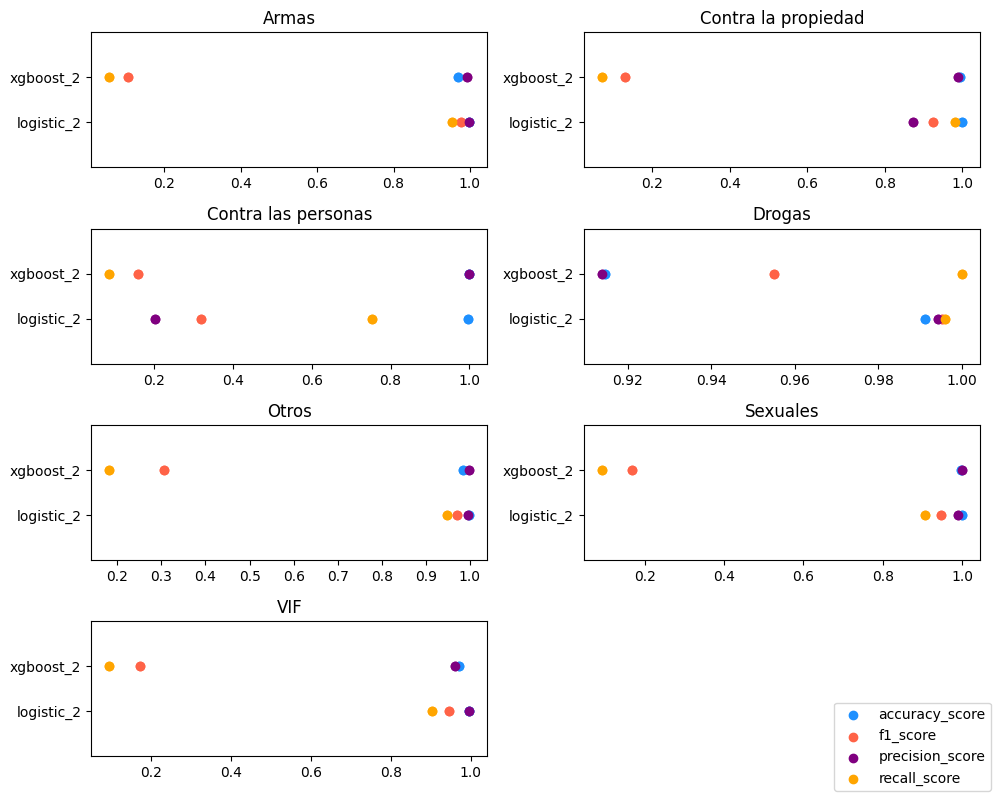

In [98]:
# se genera un diccionario con los modelos para generar un dataframe con las metricas
diccionario_modelos_2 = {
    'logistic_2': logmodel_best_2,
    'xgboost_2': xgboost_model_2
}
# Generamos el gráfico de comparación
faux.generar_graficos_comparacion(diccionario_modelos_2, X_test_2, y_test_2, label_encoder)

<font color='Blue'> Del grafico podemos deducir lo siguiente: </font>
-<font color='Blue'> En general en todas las categorías se obtuvo muy buena precisión, sin embargo, existe una diferencia significativa en sensibilidad de los modelos. </font>
-<font color='Blue'> Por lo anterior decidimos evaluar el f1-score, que se observa con puntos de color naranja. De lo podemos decir que visualmente el modelo que obtuvo **mejores resultados** es la **Regresión Logística**. </font>


### 14.4 Reporte del mejor modelo predictivo en base a los resultados. 

Observamos que al comparar los dos modelos clasificatorios se obtienen diferentes resultados, se presentan en la siguiente lista desde el mejor modelo al peor.

1. **Logistic Regression.**
2. **XGBoost.**

En primer lugar comparamos el F1-score, debido a que es un promedio entre Precision y Recall. 

Recordemos que **F1-Score** es la media armónica de la precisión y recall;  y se utiliza como métrica en los escenarios en los que la elección de la precisión o recall puede resultar en un compromiso en términos de que el modelo proporcione un alto número de falsos positivos y falsos negativos, respectivamente.

Nuestro mejor caso (**Regresión Logística**) alcanza los siguientes resultados: de un 100% para la categoria '*Drogas*', seguida de un 98% en las categorías *'Armas'* y un 97% para la categoría *'Otros'*, continuando con un 95% para las categorías *'Sexuales'* y *'VIF'*, finalizando con un 92% y 32% para las categorías *'Contra la propiedad'* y *'Contra las personas'* respectivamente.


Seguida por XGBoost con un 95% para la categoría '*Drogas*', seguida de un 31% para la categoría *'Otros'* y un 17% para las categorías *'Sexuales'* y *'VIF'*, finalizando con un 16%, 13% y 10% para las categorías *'Contra las personas'*, *'Contra la propiedad'* y *'Armas'* respectivamente.

De la misma manera se comparó precision y recall, en donde se obtienen resultados que aseveran el orden de mejor modelo a peor modelo predictivo.


Recapitulando lo que se habló en el punto 6.6, pero con los actuales resultados:
**Precision** corresponde a la puntuación que permite medir el rendimiento del modelo a partir del recuento de verdaderos positivos de la manera correcta de todas las predicciones positivas realizadas. En el caso de nuestro mejor modelo corresponde a las siguientes metricas: 100% para las categorías *'Armas'* y *'Otros'*, un 99% para las categorías *'Drogas'*, *'Sexuales'* y *'VIF'*, finalizando con un 87% y un 20% para las categorías *'Contra la propiedad'* y *'Contra las personas'* respectivamente.


**Recall** o **Sensibilidad** corresponde a la puntuación que permite medir el rendimiento del modelo a partir del recuento de verdaderos positivos de forma correcta de todos los valores positivos reales. En nuestro mejor modelo observamos los siguientes resultados:  100% para las categorías *'Drogas'*, un 98% para la categoría *'Contra la propiedad'*, un 95% para las categorías *'Armas'* y *'Otros'*, finalizando con un 91%, 90% y 75% para las categorías *'Sexuales'*, *'VIF'* y *'Contra las personas'* respectivamente.

**Acurracy** corresponde a la puntuación que permite medir el rendimiento del modelo a partir de la proporción de la suma de verdaderos positivos y verdaderos negativos de todas las predicciones realizadas. Po lo anterior en general se concidera una buena metrica, en nuestro caso tiene muy buenos resultados, sin embargo, no es correcta su utilización debido a que esta metrica no funciona correctamente cuando hay desbalance de clases.


_____________

## <font color='MediumSeaGreen'>Sección 14.- Validación </font>

Ya con el mejor modelo definido, en este caso **Regresión Logística**, evaluaremos con denuncias reales separadas y guardadas en primera instancia de este proyecto con el fin de realizar una evaluación final de nuestro proyecto.

### 14.1 Importación de data de validación 1

Importamos la data de validación 1 guardada en el capitulo 3.6 de este proyecto

In [99]:
#Importar data de validación 1
validacion_1 = pd.read_csv('df_validacion.csv', sep=';', encoding='utf-8')
data_validacion_1 = pd.DataFrame(validacion_1)

In [100]:
#Revisamos los datos importados en data_validacion_1
data_validacion_1.head()

,GLOSA,FECHA_LLAMADA,ESTADO,COD_COM,COMUNA,CATEGORIZACIÓN_SIMPLIFICADA
0,W20211121185757013 PRESUNTO MICROTRÁFICO DE PA...,21-11-2021,Denuncia jurídica,2201.0,Calama,Drogas
1,"PRESUNTO MICROTRÁFICO DE DROGA, SE IGNORA TIPO...",21-01-2022,Denuncia jurídica,13108.0,San Javier,Drogas
2,"PRESUNTO DELITO DE ESTUPRO, EFECTUADO POR VÍCT...",25-07-2022,Denuncia jurídica,8111.0,Tomé,Sexuales
3,"PRESUNTO MICROTRÁFICO DE DROGA, EFECTUADO POR ...",06-06-2022,Denuncia Jurídica,13110.0,La Florida,Drogas
4,Personas dedicadas al robo o receptación de es...,12-08-2021,Rechazado,13123.0,Providencia,Contra la propiedad


<font color='Blue'> Se observa que la importación de data_validacion_1 se realizó correctamente. </font>

### 14.2 Importación de data de validación 2

Importamos la data de validación 2 guardada en el capitulo 12.3 de este proyecto

In [101]:
#Importar data de validación 2
validacion_2 = pd.read_csv('df_validacion_2.csv', sep=';', encoding='utf-8')
data_validacion_2 = pd.DataFrame(validacion_2)

In [102]:
#Revisamos los datos importados en data_validacion_2
data_validacion_2.head()

,GLOSA_PROCESADA,CATEGORIZACIÓN_SIMPLIFICADA
0,en arquitecto maria isabel navarro alvarez 642...,1.0
1,en leif ericson 996 una mujer le pego a su beb...,6.0
2,Quiero denuniciar a una turba que entró a mi a...,1.0
3,en luis alberto andrade balcazar 880 un hombre...,2.0
4,“EN RELACIÓN A LOS HECHOS QUE VENGO A DENUNCIA...,6.0


<font color='Blue'> Se observa que la importación de data_validacion_2 se realizó correctamente. </font>

### 14.3 Comparación de ambas datas de validación

Previo a unir ambas data de validación (Data entregada por Denuncia Seguro, escrita por Abogados y Analistas y la Data de denuncias realizadas por personas sin redacción de terceros) debemos realizar una comparación e igualar las columnas a evaluar, tanto en nombres como en la cantidad de columnas.

In [103]:
#Revisamos que ambas datas de validación que contengan las mismas columnas antes de concatenar 
faux.compara_columns_df(data_validacion_1,data_validacion_2)

Campos que difieren entre DataFrame 1 y DataFrame 2: 
 {'GLOSA', 'FECHA_LLAMADA', 'COMUNA', 'ESTADO', 'COD_COM'}

Campos que difieren entre DataFrame 2 y DataFrame 1: 
 {'GLOSA_PROCESADA'}


<font color='Blue'> Ambas data de validación presentan una columna que contiene una denuncia realizada, sin emabrgo estan con nombres distintos es por ello que igualaremos el nombre de dicha columna y eliminaremos las otras columnas que no utilizamos. </font>

In [104]:
#Eliminamos la colunmnas
data_validacion_1 = data_validacion_1.drop(columns=['FECHA_LLAMADA', 'COMUNA', 'COD_COM', 'ESTADO'])

In [105]:
#Igualamos los nombres de las columnas
data_validacion_2 = data_validacion_2.rename(columns={'GLOSA_PROCESADA': 'GLOSA'})

In [106]:
#Revisamos que ambas datas de validación que contengan las mismas columnas previo a concatenar 
faux.compara_columns_df(data_validacion_1,data_validacion_2)

Campos que difieren entre DataFrame 1 y DataFrame 2: 
 set()

Campos que difieren entre DataFrame 2 y DataFrame 1: 
 set()


In [107]:
#Contamos las filas y las columnas de ambos DataFrame
faux.contador_filas_columns(data_validacion_1,data_validacion_2)

La cantidad de registros en Data Frame 1:
 filas, columnas: (3036, 2)
La cantidad de registros en Data Frame 2:
 filas, columnas: (45, 2)


<font color='Blue'>Se consta que no existen diferencias en el número de columnas y sus nombres, sin embargo existe una diferencia significativa en el numero total de filas entre la data_validacion_1 y la data_validacion_2 , al ser una relación muy desproporcionada (67:1) decidimos disminuir la data de validación 1 (Denuncia procesada por abogados y analistas) a el mismo número de denuncias escritas por personas sin intervención de terceros.  Con el fin de que la evaluación de nuestros modelos sea una evaluación proporcional a denuncias escritas por abogados y personas sin conocimiento jurídico. </font>

### 14.4 Union de ambas datas de validación

Tal como lo indica el punto anterior se reducirá la data de validación 1 , quedando a el mismo número de denuncias que posee la data de validación 2. Es decir, igualaremos la relación entre ambas datas siendo de 67:1 a 1:1 y las concatenaremos, creando una sola data de validación con un total de 90 denuncias.

In [108]:
# Uniremos ambos dataframe
# se seleccionan solo 45 filas para que sea balanceado entre la primera data de validacion y la segunda
data_validacion_1 = data_validacion_1.sample(n=45,random_state=RANDOM_SEED)
data_validacion = pd.concat([data_validacion_1,data_validacion_2], ignore_index=True)

#Observamos los cambios realizados
data_validacion

,GLOSA,CATEGORIZACIÓN_SIMPLIFICADA
0,PRESUNTO DELITO DE VIOLENCIA INTRAFAMILIAR NO ...,VIF
1,"PRESUNTO MICROTRÁFICO DE DROGAS, EFECTUADO POR...",Drogas
2,"PRESUNTO MICROTRÁFICO DE MARIHUANA PROCESADA, ...",Drogas
3,"PRESUNTO MICROTRÁFICO DE COCAÍNA BASE, EFECTUA...",Drogas
4,PRESUNTO MICROTRÁFICO DE CLORHIDRATO DE COCAÍN...,Drogas
...,...,...
85,El profesor de historia del liceo eduardo linc...,5.0
86,mi esposo me obliga a tener relaciones sexuale...,6.0
87,"en canal la luz oriente 503 ayer en la noche, ...",0.0
88,en huachipato 823 el joven de la casa le dispa...,4.0


<font color='Blue'>Nos percatamos que la columna *‘CATEGORIZACiÓN_SIMPLIFICADA’* contiene información escrita con palabras y en código simplificado por categoría que se había realizado previamente. Con el fin de corregir el problema transformaremos la data a el código simplificado por categoría y la guardaremos toda en formato integrer. </font>

In [109]:
# Revisamos las categorias y sus cantidades
data_validacion['CATEGORIZACIÓN_SIMPLIFICADA'].value_counts()

Drogas                 37
6.0                    11
3.0                     9
5.0                     8
1.0                     6
2.0                     6
VIF                     5
0.0                     3
Contra la propiedad     2
4.0                     2
Otros                   1
Name: CATEGORIZACIÓN_SIMPLIFICADA, dtype: int64

In [110]:
# corregimos los problemas de categoria
# las categorias de exto las transformamos a int
# las categorias float las transformamos a int
data_validacion['CATEGORIZACIÓN_SIMPLIFICADA'] = data_validacion['CATEGORIZACIÓN_SIMPLIFICADA'].apply(lambda x: list(dict_clases.values()).index(x) if x in list(dict_clases.values()) else int(x))

In [111]:
# validamos que el proceso de correccion haya resultado
data_validacion['CATEGORIZACIÓN_SIMPLIFICADA'].value_counts()

3    46
6    16
1     8
5     8
2     6
4     3
0     3
Name: CATEGORIZACIÓN_SIMPLIFICADA, dtype: int64

<font color='Blue'>Observamos que los cambios se realizaron correctamente y nuestra data de validación presenta lo siguiente: </font>
- <font color='Blue'>**3** (*’Drogas’* ) tiene 46 denuncias. </font>
- <font color='Blue'>**6** (*’VIF’* ) tiene 16 denuncias. </font>
- <font color='Blue'>**1** (*’Contra la propiedad’* ) tiene 8 denuncias. </font>
- <font color='Blue'>**5** (*'Sexuales’* ) tiene 8 denuncias. </font>
- <font color='Blue'>**2** (*’Contra las personas’* ) tiene 6 denuncias. </font>
- <font color='Blue'>**4** (*‘Otros’* ) tiene 3 denuncias. </font>
- <font color='Blue'>**0** (*’Armas’* ) tiene 3 denuncias. </font>


### 14.5 Comparación en la predicción de modelo 1 y modelo 2

Utilizando la data de validación balanceada generaremos dos predicciones , una con el primer modelo que fue entrenado solo con la Data Entregada por Denuncia Seguro y otra con el mejor modelo final entranada con toda la data recolectada.

In [112]:
# se genera la predicción de las clases y de la probabilidad utilizando el modelo sin mejorar y la data de validacion
y_hat_val = faux.predict_category(logmodel_best, count_vectorizer, label_encoder, list(data_validacion['GLOSA'].values))[0]
print(classification_report(data_validacion['CATEGORIZACIÓN_SIMPLIFICADA'], y_hat_val, target_names=target_names))

                     precision    recall  f1-score   support

              Armas       0.00      0.00      0.00         3
Contra la propiedad       0.67      0.25      0.36         8
Contra las personas       0.00      0.00      0.00         6
             Drogas       1.00      0.63      0.77        46
              Otros       0.07      1.00      0.13         3
           Sexuales       0.75      0.38      0.50         8
                VIF       1.00      0.50      0.67        16

           accuracy                           0.50        90
          macro avg       0.50      0.39      0.35        90
       weighted avg       0.82      0.50      0.59        90



#### <font color='Blue'>Para Regresión Logística del primer modelo se observan las siguientes métricas: </font>

<font color='Blue'>**El modelo tiene un accuracy de**:</font>

- <font color='Blue'>50%.</font>

<font color='Blue'>**El modelo tiene una precisión de:** </font>
- <font color='Blue'>0% para la categoría "Armas, </font>
- <font color='Blue'>67% para la categoría "Contra la propiedad", </font>
- <font color='Blue'>0% para la categoría "Contra las personas"</font>
- <font color='Blue'>100% para la categoría "Drogas"</font>
- <font color='Blue'>7% para la categoría "Otros"</font>
- <font color='Blue'>75% para la categoría "Sexuales"</font>
- <font color='Blue'>100% para la categoría "VIF"</font>

<font color='Blue'>**El modelo tiene una sensibilidad (recall) de:** </font>

- <font color='Blue'>0% para la categoría "Armas", </font>
- <font color='Blue'>25% para la categoría "Contra la propiedad" ,</font>
- <font color='Blue'>0% para la categoría "Contra las personas",</font>
- <font color='Blue'>63% para la categoría "Drogas",</font>
- <font color='Blue'>100% para la categoría "Otros",</font>
- <font color='Blue'>38% para la categoría "Sexuales",</font>
- <font color='Blue'>50% para la categoría "VIF".</font>

<font color='Blue'>**El modelo tiene un f1-score (media armonica entre pres. y sensibilidad) de:** </font>

- <font color='Blue'>0% para la categoría "Armas",</font>
- <font color='Blue'>36% para la categoría "Contra la propiedad",</font>
- <font color='Blue'>0% para la categoría "Contra las personas",</font>
- <font color='Blue'>77% para la categoría "Drogas",</font>
- <font color='Blue'>13% para la categoría "Otros",</font>
- <font color='Blue'>50% para la categoría "Sexuales",</font>
- <font color='Blue'>65% para la categoría "VIF".</font>


<font color='Blue'> Como se puede observar en las métricas del modelo 1 son bastante bajas, con f1-score de 0 para las categorías Armas y Contra las personas, nos permite concluir que el primer modelo efectivamente no nos permitía clasificar de manera correcta denuncias ingresadas por personas que utilicen un léxico utilizado comúnmente por los Chilenos, si recordamos las métricas resultantes cuando solo utilizamos denuncias preprocesadas por Abogados y Analistas, los resultados obtenidos eran demasiado buenos, esto se puede deber a que utilizaban un mismo vocabulario de manera repetitiva. </font>

In [113]:
# se genera la predicción de las clases y de la probabilidad utilizando el modelo mejorado y la data de validacion
y_hat_val = faux.predict_category(logmodel_best_2, count_vectorizer_2, label_encoder, list(data_validacion['GLOSA'].values))[0]
print(classification_report(data_validacion['CATEGORIZACIÓN_SIMPLIFICADA'], y_hat_val, target_names=target_names))

                     precision    recall  f1-score   support

              Armas       0.18      0.67      0.29         3
Contra la propiedad       0.80      0.50      0.62         8
Contra las personas       0.20      0.33      0.25         6
             Drogas       0.97      0.76      0.85        46
              Otros       0.50      0.33      0.40         3
           Sexuales       0.78      0.88      0.82         8
                VIF       0.88      0.94      0.91        16

           accuracy                           0.73        90
          macro avg       0.62      0.63      0.59        90
       weighted avg       0.83      0.73      0.77        90



#### <font color='Blue'>Para Regresión Logística del segundo modelo se observan las siguientes métricas: </font>

<font color='Blue'>**El modelo tiene un accuracy de**:</font>

- <font color='Blue'>73%.</font>

<font color='Blue'>**El modelo tiene una precisión de:** </font>
- <font color='Blue'>18% para la categoría "Armas, </font>
- <font color='Blue'>80% para la categoría "Contra la propiedad", </font>
- <font color='Blue'>20% para la categoría "Contra las personas"</font>
- <font color='Blue'>97% para la categoría "Drogas"</font>
- <font color='Blue'>50% para la categoría "Otros"</font>
- <font color='Blue'>78% para la categoría "Sexuales"</font>
- <font color='Blue'>88% para la categoría "VIF"</font>

<font color='Blue'>**El modelo tiene una sensibilidad (recall) de:** </font>

- <font color='Blue'>67% para la categoría "Armas", </font>
- <font color='Blue'>50% para la categoría "Contra la propiedad" ,</font>
- <font color='Blue'>33% para la categoría "Contra las personas",</font>
- <font color='Blue'>76% para la categoría "Drogas",</font>
- <font color='Blue'>33% para la categoría "Otros",</font>
- <font color='Blue'>88% para la categoría "Sexuales",</font>
- <font color='Blue'>94% para la categoría "VIF".</font>

<font color='Blue'>**El modelo tiene un f1-score (media armonica entre pres. y sensibilidad) de:** </font>

- <font color='Blue'>29% para la categoría "Armas",</font>
- <font color='Blue'>62% para la categoría "Contra la propiedad",</font>
- <font color='Blue'>25% para la categoría "Contra las personas",</font>
- <font color='Blue'>85% para la categoría "Drogas",</font>
- <font color='Blue'>40% para la categoría "Otros",</font>
- <font color='Blue'>82% para la categoría "Sexuales",</font>
- <font color='Blue'>91% para la categoría "VIF".</font>


<font color='Blue'>Tal como se esperaba los resultados obtenidos mejoraron significativamente, al utilizar data extra para mejorar el modelo. Subiendo de un accuracy de 50% a uno de 79%, es decir logramos aumentar un 37% los elementos clasificados correctamente. 
Mientras si comparamos f1-score, que en el modelo anterior dieron un 0%, en el modelo actual resultaron: Un aumento del 29% para la categoría ‘Armas’ y un 25% para la categoría ‘Contra las personas’".</font>


______________

## <font color='MediumSeaGreen'>Sección 15.- Conclusión del proyecto </font>

La construcción de un modelo de clasificación de texto, aplicado a la plataforma “Denuncia Seguro”, podría ser de un gran beneficio para dicha página web, mejorando la captación de las denuncias, transformando un proceso engorroso a uno amigable y confiable.

La mayoría de las denuncias ingresadas en “Denuncia Seguro” corresponden a delitos ligados a la ley 20.000 de drogas, esto fue un problema necesario de abordar, en este caso, se realizó una reducción de dicha clase e ingreso de nueva data menos técnica y más acercada a lo que un usuario promedio chileno puede denunciar utilizando jergas de las drogas consumidas en el año actual.

Si bien, la construcción de dicho modelo no estuvo exenta de problemas, principalmente por que el texto analizado, es muy escueto y técnico, lo anterior fue mejorado, debido a la obtención de nueva data, tal como se menciona en el párrafo anterior, que permitió lograr un modelo funcional y apto para todo usuario.

Aunque el modelo de clasificación de denuncias da buenos resultados, este puede mejorar significativamente reentrenando con nuevas denuncias realizadas por un usuario promedio de la plataforma. Es por ello por lo que se sugiere estar en constante conversaciones con “Denuncia Seguro” para la obtención de nuevas denuncias sin intervención de analistas ni abogados, con el fin de reentrenar el modelo de manera continua, logrando así una mejor clasificación con el pasar del tiempo.

Ya con el modelo de clasificación de denuncias que entrenamos podemos proseguir en el cambio en la plataforma web y disminuir el actual ingreso de denuncia que consta con 9 formularios a solo un formulario, el cual permitirá ingresar la denuncia y el modelo se encargará de clasificar la denuncia automáticamente sin tener que solicitarla directamente al usuario, tal como se hace en la actualidad. Dicha mejora nos permitirá disminuir las denuncias no realizadas sobre crímenes reales, ya que se disminuirá el tiempo de llenado de formularios y se facilitará el ingreso de denuncias, logrando captar más denuncias por la plataforma web.

Las próximas mejoras del proyecto constan en realizar una aplicación móvil fácil de utilizar, en donde se podrá ingresar texto simple de una denuncia, como imágenes, obtener la ubicación del usuario al momento de realizar la denuncia, transformar la denuncia realizada por voz en texto y clasificarla, entre otras.
De igual manera otras mejoras de nuestro proyecto que se podrán realizar es integrar a la clasificación de tipo de denuncia, la obtención automática del texto de la fecha, los nombres de personas denunciadas, comuna, direcciones, entre otros, con el fin de que automáticamente la aplicación web realicé el trabajo que actualmente realizan analistas y generar una advertencia automática cuando se mencionan las mismas personas o delitos un numero determinado de veces en un rango de tiempo con el fin de avisar a las policías locales que posiblemente exista un patrón en el modus operandi  de alguna persona o grupo de delincuentes. 


___________

## <font color='MediumSeaGreen'>Sección 16.- Simulación aplicativo Web</font>

En este capítulo se utiliza la libreria gradio para simular el desarrollo e implementacion de un aplicativo Web que utiliza el mejor modelo encontrado para clasificar una denuncia ingresada por un usuario.

In [114]:
mejor_modelo = faux.Modelo(
                modelo = logmodel_best_2,
                count_vectorizer = count_vectorizer_2,
                label_encoder = label_encoder,
                funcion_predict = faux.predict_category,
                probabilidad_corte = 0.85,#atributo no implementado
                cantidad_palabras_min = 20  
)

css = """
#id_titulo {
    text-align: center;
    font-size: xx-large;
    font-weight: 600;
}
#id_texto_predict > label > textarea {
    color: orange;
    font-size: x-large;
    text-align: center;
}
"""

# transformamos el logo a esquema data uri para utilizarla en como src de una imagen html
filepath        = 'PredictLab.png'
binary_fc       = open(filepath, 'rb').read()
base64_utf8_str = base64.b64encode(binary_fc).decode('utf-8')
ext             = filepath.split('.')[-1]
dataurl         = f'data:image/{ext};base64,{base64_utf8_str}'

with gr.Blocks(css=css) as app:
    gr.Markdown("Clasificador de denuncia",elem_id="id_titulo")
    input_glosa = gr.Textbox(label="Ingrese la denuncia", lines=10, placeholder="Escribe tu denuncia con la mayor cantidad de información posible")
    btn = gr.Button(value="Enviar")
    output_texto = gr.Textbox(label="Tipo de delito", elem_id="id_texto_predict")
    output_clase = gr.Label(label='Detalle')
    btn.click(mejor_modelo.make_prediction, input_glosa, [output_texto, output_clase])
    #gr.Image("PredictLab.png",elem_id="id_logo",show_label=False)
    gr.HTML(f"<center><img src='{dataurl}' width=200 height=200 /></center>")
    

display(app.launch(share=True))

Running on local URL:  http://127.0.0.1:7860
Running on public URL: https://bed902c2-fc03-48ac.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades (NEW!), check out Spaces: https://huggingface.co/spaces


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=1783b84c-867d-4124-84ad-5bf327fda65d' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>